<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#1.-Creation-of-a-study-data-frame" data-toc-modified-id="1.-Creation-of-a-study-data-frame-1">1. Creation of a study data-frame</a></span><ul class="toc-item"><li><span><a href="#1.1.-Base-of-the-data-frame" data-toc-modified-id="1.1.-Base-of-the-data-frame-1.1">1.1. Base of the data-frame</a></span></li><li><span><a href="#1.1-Adding-others-metrics" data-toc-modified-id="1.1-Adding-others-metrics-1.2">1.1 Adding others metrics</a></span></li><li><span><a href="#1.2.-Creation-of-a-second-data-frame-containing-info-for-each-day" data-toc-modified-id="1.2.-Creation-of-a-second-data-frame-containing-info-for-each-day-1.3">1.2. Creation of a second data-frame containing info for each day</a></span></li><li><span><a href="#1.3.-Determining-CP,-W'-and-FTP-using-power-duration-model" data-toc-modified-id="1.3.-Determining-CP,-W'-and-FTP-using-power-duration-model-1.4">1.3. Determining CP, W' and FTP using power duration model</a></span></li><li><span><a href="#1.4.-Adding-Intensity-factor,-TSS-and-Variability-Index-to-activty-data-frame" data-toc-modified-id="1.4.-Adding-Intensity-factor,-TSS-and-Variability-Index-to-activty-data-frame-1.5">1.4. Adding Intensity factor, TSS and Variability Index to activty data-frame</a></span></li><li><span><a href="#1.5.-Adding-power-distribution-(with-25w-band-width)" data-toc-modified-id="1.5.-Adding-power-distribution-(with-25w-band-width)-1.6">1.5. Adding power distribution (with 25w band width)</a></span></li><li><span><a href="#1.6.-Adding-PPR-and-PPR-2000KJ-for-each-year" data-toc-modified-id="1.6.-Adding-PPR-and-PPR-2000KJ-for-each-year-1.7">1.6. Adding PPR and PPR 2000KJ for each year</a></span></li></ul></li><li><span><a href="#2.-Visualization-of-the-data" data-toc-modified-id="2.-Visualization-of-the-data-2">2. Visualization of the data</a></span><ul class="toc-item"><li><span><a href="#2.1.-Overview-of-the-2-dataframes" data-toc-modified-id="2.1.-Overview-of-the-2-dataframes-2.1">2.1. Overview of the 2 dataframes</a></span></li><li><span><a href="#2.2.-Distance,-duration-and-TSS" data-toc-modified-id="2.2.-Distance,-duration-and-TSS-2.2">2.2. Distance, duration and TSS</a></span></li><li><span><a href="#2.3.-Mean-maximal-power-(all-and-under-fatigue)" data-toc-modified-id="2.3.-Mean-maximal-power-(all-and-under-fatigue)-2.3">2.3. Mean maximal power (all and under fatigue)</a></span></li><li><span><a href="#2.4.-Year-recap'-(Distance,-duration,-nbr-activity)" data-toc-modified-id="2.4.-Year-recap'-(Distance,-duration,-nbr-activity)-2.4">2.4. Year recap' (Distance, duration, nbr activity)</a></span></li><li><span><a href="#2.5.-TSS,-ATL,-CTL-and-TSB-evolution" data-toc-modified-id="2.5.-TSS,-ATL,-CTL-and-TSB-evolution-2.5">2.5. TSS, ATL, CTL and TSB evolution</a></span></li><li><span><a href="#2.6.-Power-distribution" data-toc-modified-id="2.6.-Power-distribution-2.6">2.6. Power distribution</a></span></li><li><span><a href="#2.7.-PPR-and-PPR-2000KJ" data-toc-modified-id="2.7.-PPR-and-PPR-2000KJ-2.7">2.7. PPR and PPR 2000KJ</a></span></li><li><span><a href="#2.8.-Radar-chart-of-power-compare-to-top-10%-value-of-professional-rider" data-toc-modified-id="2.8.-Radar-chart-of-power-compare-to-top-10%-value-of-professional-rider-2.8">2.8. Radar chart of power compare to top 10% value of professional rider</a></span></li></ul></li></ul></div>

In [27]:
import json
import pandas as pd
import numpy as np

import statistics
import datetime 
from itertools import combinations
import sweat

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from scipy.optimize import least_squares
from scipy.optimize import curve_fit

from math import pi

import functions_strava as fs

from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go

In [2]:
pd.set_option('display.max_columns', None)

In [9]:
def setup_dataset() : 
    # Open the Dataset_training_2013_2018
    filename = "Data/Dataset_training_2013_2018.json"

    with open(filename, "r") as f:
        Dataset_2013_2018 = json.load(f)
        
    # Open the Dataset_training_2019_2023
    filename = "Data/Dataset_training_2019_2023.json"

    with open(filename, "r") as f:
        Dataset_2019_2023 = json.load(f)
        
    # Open the Dataset_training_HT
    filename = "Data/Dataset_training_HT.json"

    with open(filename, "r") as f:
        Dataset_HT = json.load(f)
        
    # Open the Dataset_training_Manual
    filename = "Data/Dataset_training_Manual.json"

    with open(filename, "r") as f:
        Dataset_Manual = json.load(f)
    
    # Merging all the dictionnary
    Data_test = {**Dataset_2013_2018, **Dataset_2019_2023, **Dataset_HT, **Dataset_Manual}
    
    for ID in Data_test : 
        if  "moving" in Data_test[ID] :
            for ID in Data_test:
                if ID == '3564333412':  # Skip this ID
                    continue
                    for data_type in Data_test[ID]:
                        if (data_type != "moving") and (data_type != "date") and (data_type != "type"):
                            if len(Data_test[ID]["moving"]) == len(Data_test[ID][data_type]) :
                                Data_test[ID][data_type] = [Data_test[ID][data_type][i] for i in range(len(Data_test[ID]["moving"])) if Data_test[ID]["moving"][i]]
                            else :
                                continue
                        else :
                            continue
        else :
            continue
            
    #Clean the dataset of all None value in the watts list, replace them by 0
    for ID in Data_test : 
        if ("watts" in Data_test[ID]):
            Data_test[ID]["watts"] = [0 if x is None else x for x in Data_test[ID]["watts"]]
            Data_test[ID]["watts"] = [0 if (x > 1500) else x for x in Data_test[ID]["watts"]]
    
    return Data_test

In [2]:
def setup_df_df_test() :
    
    # Load the data-frame
    df_test = pd.read_csv('Dataset_training_McNulty.csv')
    df_test.set_index('ID', inplace=True)
    
    df = pd.read_csv("Dataset_training_McNulty_df.csv")
    df.set_index('Date', inplace=True)
    
    return df_test,df

In [13]:
def save_df_df_test(df, df_test) :
    df_test.to_csv('Dataset_training_McNulty.csv')
    df.to_csv("Dataset_training_McNulty_df.csv")

In [10]:
Data_test = setup_dataset()

In [47]:
df_test, df = setup_df_df_test()

In [ ]:
save_df_df_test(df, df_test)

In [25]:
# Open the Dataset_training_2013_2018
filename = "Dataset_training_2013_2018.json"

with open(filename, "r") as f:
    Dataset_2013_2018 = json.load(f)

In [26]:
# Open the Dataset_training_2019_2023
filename = "Dataset_training_2019_2023.json"

with open(filename, "r") as f:
    Dataset_2019_2023 = json.load(f)

In [27]:
# Open the Dataset_training_HT
filename = "Dataset_training_HT.json"

with open(filename, "r") as f:
    Dataset_HT = json.load(f)

In [28]:
# Open the Dataset_training_Manual
filename = "Dataset_training_Manual.json"

with open(filename, "r") as f:
    Dataset_Manual = json.load(f)

In [29]:
# Merging all the dictionnary

Data_test = {**Dataset_2013_2018, **Dataset_2019_2023, **Dataset_HT, **Dataset_Manual}

In [30]:
for ID in Data_test : 
    if  "moving" in Data_test[ID] :
        for ID in Data_test:
            if ID == '3564333412':  # Skip this ID
                continue
                for data_type in Data_test[ID]:
                    if (data_type != "moving") and (data_type != "date") and (data_type != "type"):
                        if len(Data_test[ID]["moving"]) == len(Data_test[ID][data_type]) :
                            Data_test[ID][data_type] = [Data_test[ID][data_type][i] for i in range(len(Data_test[ID]["moving"])) if Data_test[ID]["moving"][i]]
                        else :
                            continue
                    else :
                        continue
    else :
        continue

In [31]:
#Clean the dataset of all None value in the watts list, replace them by 0
for ID in Data_test : 
    if ("watts" in Data_test[ID]):
        Data_test[ID]["watts"] = [0 if x is None else x for x in Data_test[ID]["watts"]]
        Data_test[ID]["watts"] = [0 if (x > 1500) else x for x in Data_test[ID]["watts"]]

In [157]:
# Save the data-frame

df_test.to_csv('Dataset_training_McNulty.csv')

In [158]:
df.to_csv("Dataset_training_McNulty_df.csv")

In [2]:
# Load the data-frame

df_test = pd.read_csv('Dataset_training_McNulty.csv')
df_test.set_index('ID', inplace=True)

In [3]:
df = pd.read_csv("Dataset_training_McNulty_df.csv")
df.set_index('Date', inplace=True)

# 1. Creation of a study data-frame 

## 1.1. Base of the data-frame

In [122]:
# Create an empty Pandas dataframe
df_test = pd.DataFrame(columns=['Type', 'Date'])

# Iterate over the dictionary and add each ID and its values to the dataframe
for activity_id, activity_dict in Data_test.items():
    row = {'Type': activity_dict['type'], 'Date': activity_dict['date']}
    df_test = pd.concat([df_test, pd.DataFrame(row, index=[activity_id])])
    df_test['Date'] = pd.to_datetime(df_test['Date'],dayfirst=True, errors='raise')
# Set the index name
df_test.index.name = 'ID'

In [123]:
# Sort DataFrame by 'Date'
df_test = df_test.sort_values(by='Date')

In [124]:
df_test.head()

,Type,Date
ID,,
40370900,Ride,2012-01-07
40370908,Ride,2012-01-08
40370906,Ride,2012-01-10
40370887,Ride,2012-01-13
40370893,Ride,2012-01-13


In [125]:
# Remove leading and trailing whitespaces

df_test["Type"] = df_test["Type"].str.strip()

In [126]:
df_test

,Type,Date
ID,,
40370900,Ride,2012-01-07
40370908,Ride,2012-01-08
40370906,Ride,2012-01-10
40370887,Ride,2012-01-13
40370893,Ride,2012-01-13
...,...,...
8855238545,Ride,2023-04-08
8912151574,Ride,2023-04-18
8918012336,Ride,2023-04-19


## 1.1 Adding others metrics

In [127]:
# Add distance of training
df_test["Distance (Km)"]=np.nan

for activity in Data_test :
    distance = Data_test[activity].get("Distance (Km)", None)
    if distance :
        df_test.loc[activity, "Distance (Km)"] = distance
    else :
        # Get the distance data
        distance_data = Data_test[activity].get("distance", [])
        # Check if distance_data is not empty
        if distance_data:
            df_test.loc[activity, "Distance (Km)"] = round(max(distance_data)/1000, 2)
        else:
            print(f"No 'Distance (Km)' or 'distance' data found for activity {activity}")

No 'Distance (Km)' or 'distance' data found for activity 1743023616
No 'Distance (Km)' or 'distance' data found for activity 1792578230
No 'Distance (Km)' or 'distance' data found for activity 1156496404
No 'Distance (Km)' or 'distance' data found for activity 595325821
No 'Distance (Km)' or 'distance' data found for activity 684463934
No 'Distance (Km)' or 'distance' data found for activity 595345551
No 'Distance (Km)' or 'distance' data found for activity 456248099
No 'Distance (Km)' or 'distance' data found for activity 53883956
No 'Distance (Km)' or 'distance' data found for activity 40370591
No 'Distance (Km)' or 'distance' data found for activity 40370658
No 'Distance (Km)' or 'distance' data found for activity 40370666
No 'Distance (Km)' or 'distance' data found for activity 40370838
No 'Distance (Km)' or 'distance' data found for activity 40370857
No 'Distance (Km)' or 'distance' data found for activity 40370884
No 'Distance (Km)' or 'distance' data found for activity 40370887


In [128]:
# Add duration of training
df_test["Duration (hh:mm:ss)"]=np.nan

for activity in Data_test :
    duration = Data_test[activity].get("Duration (hh:mm:ss)", None)
    if duration :
        df_test.loc[activity, "Duration (hh:mm:ss)"] = duration
    else :
        duration_data = Data_test[activity].get("time", [])
        if duration_data:
            tot_sec = (max(duration_data) - min(duration_data))
            hours = tot_sec // 3600
            minutes = (tot_sec % 3600) // 60
            seconds = tot_sec % 60
            df_test.loc[activity, "Duration (hh:mm:ss)"] = f"{hours:02d}:{minutes:02d}:{seconds:02d}"
        else :
            print(f"No 'Duration (hh:mm:ss)' or 'time' data found for activity {activity}")

No 'Duration (hh:mm:ss)' or 'time' data found for activity 1743023616
No 'Duration (hh:mm:ss)' or 'time' data found for activity 1792578230
No 'Duration (hh:mm:ss)' or 'time' data found for activity 1156496404
No 'Duration (hh:mm:ss)' or 'time' data found for activity 595325821
No 'Duration (hh:mm:ss)' or 'time' data found for activity 684463934
No 'Duration (hh:mm:ss)' or 'time' data found for activity 595345551
No 'Duration (hh:mm:ss)' or 'time' data found for activity 456248099
No 'Duration (hh:mm:ss)' or 'time' data found for activity 53883956
No 'Duration (hh:mm:ss)' or 'time' data found for activity 40370591
No 'Duration (hh:mm:ss)' or 'time' data found for activity 40370658
No 'Duration (hh:mm:ss)' or 'time' data found for activity 40370666
No 'Duration (hh:mm:ss)' or 'time' data found for activity 40370838
No 'Duration (hh:mm:ss)' or 'time' data found for activity 40370857
No 'Duration (hh:mm:ss)' or 'time' data found for activity 40370884
No 'Duration (hh:mm:ss)' or 'time' dat

In [129]:
# Some manual correction of Duration value (most of time it is mandatory due to long break in ride)
df_test.loc["40370898", "Duration (hh:mm:ss)"] = f"{2:02d}:{58:02d}:{58:02d}"
df_test.loc["40370705", "Duration (hh:mm:ss)"] = f"{0:02d}:{52:02d}:{59:02d}"
df_test.loc["40370598", "Duration (hh:mm:ss)"] = f"{1:02d}:{40:02d}:{8:02d}"
df_test.loc["49246693", "Duration (hh:mm:ss)"] = f"{0:02d}:{26:02d}:{45:02d}"
df_test.loc["53883913", "Duration (hh:mm:ss)"] = f"{1:02d}:{38:02d}:{6:02d}"
df_test.loc["184945942", "Duration (hh:mm:ss)"] = f"{2:02d}:{1:02d}:{37:02d}"
df_test.loc["191930537", "Duration (hh:mm:ss)"] = f"{1:02d}:{58:02d}:{53:02d}"
df_test.loc["222544882", "Duration (hh:mm:ss)"] = f"{2:02d}:{35:02d}:{18:02d}"
df_test.loc["240801642", "Duration (hh:mm:ss)"] = f"{1:02d}:{38:02d}:{55:02d}"
df_test.loc["351312971", "Duration (hh:mm:ss)"] = f"{1:02d}:{21:02d}:{57:02d}"
df_test.loc["1287789432", "Duration (hh:mm:ss)"] = f"{4:02d}:{17:02d}:{52:02d}"
df_test.loc["1548098128", "Duration (hh:mm:ss)"] = f"{6:02d}:{18:02d}:{22:02d}"
df_test.loc["1831132231", "Duration (hh:mm:ss)"] = f"{5:02d}:{30:02d}:{14:02d}"
df_test.loc["1845887509", "Duration (hh:mm:ss)"] = f"{5:02d}:{2:02d}:{37:02d}"
df_test.loc["2024417384", "Duration (hh:mm:ss)"] = f"{4:02d}:{1:02d}:{50:02d}"
df_test.loc["2065644928", "Duration (hh:mm:ss)"] = f"{6:02d}:{11:02d}:{44:02d}"
df_test.loc["2662007434", "Duration (hh:mm:ss)"] = f"{4:02d}:{35:02d}:{39:02d}"
df_test.loc["3291865260", "Duration (hh:mm:ss)"] = f"{1:02d}:{50:02d}:{2:02d}"
df_test.loc["3544636740", "Duration (hh:mm:ss)"] = f"{0:02d}:{6:02d}:{39:02d}"
df_test.loc["4212104750", "Duration (hh:mm:ss)"] = f"{5:02d}:{29:02d}:{4:02d}"
df_test.loc["4378034594", "Duration (hh:mm:ss)"] = f"{4:02d}:{39:02d}:{37:02d}"
df_test.loc["5678752710", "Duration (hh:mm:ss)"] = f"{6:02d}:{30:02d}:{24:02d}"
df_test.loc["6289508021", "Duration (hh:mm:ss)"] = f"{4:02d}:{2:02d}:{37:02d}"
df_test.loc["8108207886", "Duration (hh:mm:ss)"] = f"{3:02d}:{29:02d}:{2:02d}"
df_test.loc["8697390321", "Duration (hh:mm:ss)"] = f"{5:02d}:{32:02d}:{23:02d}"

In [130]:
# Add power avg
df_test["Power avg (W)"]=np.nan

for activity in Data_test :
    if ("watts" in Data_test[activity]) and (any(Data_test[f"{activity}"]["watts"])) :
        power_list = Data_test[f"{activity}"]["watts"]
        power_list_without_none = [x for x in power_list if x is not None]
        df_test.loc[activity, "Power avg (W)"] = int(statistics.mean(power_list_without_none))
    else : 
        continue

In [131]:
# Add Normalized Power

df_test["Nomalized Power (W)"]=np.nan

for activity in Data_test :
    if ("watts" in Data_test[activity]) and (any(Data_test[f"{activity}"]["watts"])) :
        power_list = Data_test[f"{activity}"]["watts"]
        normalized_power = fs.cycling_norm_power(power_list)
        if not np.isnan(normalized_power):
            df_test.loc[activity, "Nomalized Power (W)"] = int(normalized_power)
        else :
            print(power_list)
            print(activity)
    else : 
        continue


[0, 0, 0, 0, 0, 0, 10, 0, 0]
1653317351
[61, 115, 98, 325, 390, 0, 0, 0, 0, 0]
1785502956
[1, 0, 0]
53883983
[0, 0, 0, 0, 3, 0]
53884024
[49, 0, 0, 51, 46, 45]
6067736415
[6, 15, 15, 0, 0]
2432540971


In [132]:
# Add avg heart rate
df_test["Heartrate avg (Bpm)"]=np.nan

for activity in Data_test :
    if ("heartrate" in Data_test[activity]) and (any(Data_test[f"{activity}"]["heartrate"])) :
        heartrate_list = pd.Series(Data_test[f"{activity}"]["heartrate"]).dropna()
        #heartrate_list_without_none = [x for x in power_list if x is not None]
        df_test.loc[activity, "Heartrate avg (Bpm)"] = int(heartrate_list.mean())
    else :
        continue

In [133]:
# Add max heart rate
df_test["Heartrate max (Bpm)"]=np.nan

for activity in Data_test :
    if ("heartrate" in Data_test[activity]) and (any(Data_test[f"{activity}"]["heartrate"])) :
        heartrate_list = pd.Series(Data_test[f"{activity}"]["heartrate"]).dropna()
        #heartrate_list_without_none = [x for x in power_list if x is not None]
        df_test.loc[activity, "Heartrate max (Bpm)"] = int(heartrate_list.max())
    else :
        continue

In [134]:
# Efficiency factor

df_test["Efficiency Factor"]=np.nan

for activity in Data_test :
    
    if not pd.isnull(df_test.loc[f"{activity}", "Power avg (W)"]) and not pd.isnull(df_test.loc[f"{activity}", "Heartrate avg (Bpm)"]) :
         df_test.loc[activity, "Efficiency Factor"] = round(df_test["Power avg (W)"][f"{activity}"]/df_test["Heartrate avg (Bpm)"][f"{activity}"],2)
    else :  
        continue

In [50]:
# Best power for 5s,10s,15s,30s,45s,1min,3min,5min,8min,10min,12min,15min,20min,30min,45min,1h
List_name = ["1s power (W)","5s power (W)","10s power (W)","15s power (W)","30s power (W)","45s power (W)","60s power (W)","2min power (W)","3min power (W)","5min power (W)","8min power (W)","10min power (W)","12min power (W)","15min power (W)","20min power (W)","30min power (W)","45min power (W)","60min power (W)","120min power (W)"]
List_duration = [1, 5, 10, 15, 30, 45, 60, 120, 180, 300, 480, 600, 720, 900, 1200, 1800, 2700, 3600, 7200] #length of the duration in seconds

for name in List_name :
    df_test[name]=np.nan
    
for activity in Data_test : 
#    print(activity)
    if activity in [2721966178, 2140641673, 2736142634]:
             continue
    else :
            for duration, name in zip(List_duration, List_name) :
                if ("watts" in Data_test[activity]) and (any(Data_test[f"{activity}"]["watts"])) and duration <= len(Data_test[f"{activity}"]["watts"]):
                    power = Data_test[f"{activity}"]["watts"]
                    best_power = fs.best_power_duration(power,duration)
                    if np.isnan(best_power):
                        df_test.loc[int(activity), name] = best_power
                    else :
                        df_test.loc[int(activity), name] = round(best_power)
            

In [25]:
#Adding a KJ count to activity to determine best power after 2000kj
for activity in Data_test : 
    if ("watts" in Data_test[activity]) and (any(Data_test[f"{activity}"]["watts"])) :
        count = 0
        List_joule = []
        for power in Data_test[f"{activity}"]["watts"] :
            count += power 
            List_joule.append(count)
         
        Data_test[f"{activity}"]["Total Effort (KJ)"] = [round(x/1000,1) for x in List_joule]


In [28]:
# Best power for 5s,10s,15s,30s,45s,1min,3min,5min,8min,10min,12min,15min,20min,30min,45min,1h after 2000Kj
List_name = ["5s power (W) P2000Kj","10s power (W) P2000Kj","15s power (W) P2000Kj","30s power (W) P2000Kj","45s power (W) P2000Kj", "60s power (W) P2000Kj","2min power (W) P2000Kj", "3min power (W) P2000Kj","5min power (W) P2000Kj","8min power (W) P2000Kj","10min power (W) P2000Kj","12min power (W) P2000Kj","15min power (W) P2000Kj","20min power (W) P2000Kj","30min power (W) P2000Kj","45min power (W) P2000Kj"]
List_duration = [5, 10, 15, 30, 45, 60, 120, 180, 300, 480, 600, 720, 900, 1200, 1800, 2700] #length of the duration in seconds

for name in List_name :
    df_test[name]=np.nan
    
for activity in Data_test : 
    if activity in [2721966178, 2140641673, 2736142634]:
             continue
#    print(activity)
    else :
        for duration, name in zip(List_duration, List_name) :
            if ("watts" in Data_test[activity]) and (any(Data_test[f"{activity}"]["watts"])) :
                power = [watts[i] for i, total_effort in enumerate(Data_test[activity]["Total Effort (KJ)"]) if total_effort > 2000 for watts in [Data_test[activity]["watts"]]]
                if duration <= len(power) :
                    best_power = fs.best_power_duration(power,duration)
                    if np.isnan(best_power):
                        df_test.loc[int(activity), name] = best_power
                    else :
                        df_test.loc[int(activity), name] = round(best_power)
                else : 
                    df_test.loc[int(activity), name] = np.nan

## 1.2. Creation of a second data-frame containing info for each day

In [138]:
#The new data_frame will have one row per day
start_date = datetime.date(2012, 1, 1)
end_date = datetime.date(2023, 6, 30)
num_days = (end_date - start_date).days + 1

# create a list of dates from start_date to end_date
dates = pd.to_datetime([start_date + datetime.timedelta(days=i) for i in range(num_days)])

# create a dictionary to hold the data
data = {
    "1s power (W)": [np.nan] * num_days,
    "5s power (W)": [np.nan] * num_days,
    "10s power (W)": [np.nan] * num_days,
    "15s power (W)": [np.nan] * num_days,
    "30s power (W)": [np.nan] * num_days,
    "45s power (W)": [np.nan] * num_days,
    "60s power (W)": [np.nan] * num_days,
    "2min power (W)": [np.nan] * num_days,
    "3min power (W)": [np.nan] * num_days,
    "5min power (W)": [np.nan] * num_days,
    "8min power (W)": [np.nan] * num_days,
    "10min power (W)": [np.nan] * num_days,
    "12min power (W)": [np.nan] * num_days,
    "15min power (W)": [np.nan] * num_days,
    "20min power (W)": [np.nan] * num_days,
    "30min power (W)": [np.nan] * num_days,
    "45min power (W)": [np.nan] * num_days,
    "60min power (W)": [np.nan] * num_days,
    "120min power (W)": [np.nan] * num_days,
}

# create the dataframe
df = pd.DataFrame(data=data, index=dates)
df.index.name = "Date"

In [139]:
# Define a function to get the best power for a duration for a given day
def get_best_power(date, duration):
    # Define the date range to consider (20 days before and after the specified day)
    start_date = date - datetime.timedelta(days=20)
    end_date = date + datetime.timedelta(days=20)

    # Subset the activity data frame to include only the rows within the date range
    subset = df_test[(df_test['Date'] >= start_date) & (df_test['Date'] <= end_date)]
    if subset.empty:
        return None
        # Find the row with the highest power for the specified duration
    else :
        if np.isnan(subset[duration]).all() :
            return np.nan
        else :    
            best_row = subset.loc[subset[duration].idxmax()]
            # Return the best power value
            return best_row[duration]

# Apply the function to each row in the daily data frame
for date in df.index:
    for duration in ["1s power (W)","5s power (W)","10s power (W)","15s power (W)","30s power (W)","45s power (W)","60s power (W)","2min power (W)","3min power (W)","5min power (W)","8min power (W)","10min power (W)","12min power (W)","15min power (W)","20min power (W)","30min power (W)","45min power (W)","60min power (W)", "120min power (W)"]:
        # Get the best power for the specified day and duration
        best_power = get_best_power(date, duration)
        # Add the best power to the daily data frame
        df.loc[date, duration] = best_power

In [140]:
# Define a function to get the best power after 2000kj for a duration for a given day
def get_best_power(date, duration):
    # Define the date range to consider (20 days before and after the specified day)
    start_date = date - datetime.timedelta(days=20)
    end_date = date + datetime.timedelta(days=20)

    # Subset the activity data frame to include only the rows within the date range
    subset = df_test[(df_test['Date'] >= start_date) & (df_test['Date'] <= end_date)]
    if subset.empty:
        return None
    else:
        if subset[duration].isna().all():
            return None
        else:
            best_row = subset.loc[subset[duration].idxmax()]

        

    # Return the best power value
    return best_row[duration]

# Apply the function to each row in the daily data frame
for date in df.index:
    for duration in ["5s power (W) P2000Kj","30s power (W) P2000Kj","60s power (W) P2000Kj","3min power (W) P2000Kj","5min power (W) P2000Kj","8min power (W) P2000Kj","10min power (W) P2000Kj","12min power (W) P2000Kj","15min power (W) P2000Kj","20min power (W) P2000Kj","30min power (W) P2000Kj","45min power (W) P2000Kj"]:
        # Get the best power for the specified day and duration
        best_power = get_best_power(date, duration)
        # Add the best power to the daily data frame
        df.loc[date, duration] = best_power

In [141]:
import warnings

warnings.filterwarnings("ignore")

## 1.3. Determining CP, W' and FTP using power duration model

In [20]:
# Power-duration relationship equation
def power_duration(t, cp, w_prime):
    return cp + (w_prime / t)


def find_best_cp_and_wp(durations, powers):
    def error_function(params):
        cp, w_prime = params
        residuals = powers - power_duration(durations, cp, w_prime)
        return residuals

    initial_params = [1.0, 1.0]  # Initial values for cp and w_prime
    result = least_squares(error_function, initial_params, bounds=(0, np.inf))

    cp, w_prime = result.x
    return cp, w_prime

def predict_power(cp, w_prime, duration):
    return power_duration(duration, cp, w_prime)

def calculate_best_critical_power_for_day(row):
    durations = [180, 300, 480, 600, 720, 900, 1200, 1800]
    powers = row[6:16].values
    
    best_cp = 0
    wbal = 0
    combo_best = 0
    FTP = 0
    
    for combo in combinations(range(len(durations)), 7):
        if np.any(np.isnan([powers[i] for i in combo])) :
            continue
        else :
            cp, wp = find_best_cp_and_wp([durations[i] for i in combo], [powers[i] for i in combo])
            FTP_estim = predict_power(cp, wp, 3600)
            if cp > best_cp:
                combo_best = combo
                best_cp = round(cp,1)
                wbal = round(wp)
                FTP = round(FTP_estim)

    return best_cp,wbal,combo_best,FTP

result_df = df.apply(calculate_best_critical_power_for_day, axis=1, result_type='expand')
result_df.columns = ["Critical Power (W)", "W' (kj)", "Combo for cp calc", "FTP (W)"]

# Combine the original dataframe with the result dataframe
df = pd.concat([df, result_df], axis=1)

In [143]:
"""
### exponential MODEL

def calculate_best_critical_power_for_day(row):
    durations = [120, 180, 300, 480, 600, 720, 900, 1200]
    powers = row[7:15].values
    dur_5 = 5
    powers_5 = row[1]
    best_cp = 0

    for combo in combinations(range(len(durations[1:])), 6) :
        X = sweat.array_1d_to_2d([dur_5] + [durations[i] for i in combo])
        y = [powers_5] + [powers[i] for i in combo]
        pdmreg = sweat.PowerDurationRegressor(model="exponential")
        pdmreg.fit(X, y)
        
        if pdmreg.cp_ > best_cp:
            combo_best = combo
            best_cp = round(pdmreg.cp_,1)
            p_max = pdmreg.p_max_
            
    durations = [30, 600, 3600]
    # Again, the regressor expects a 2 dimensional array of features.
    X = sweat.array_1d_to_2d(durations)
    print(f"Predicted power values: {pdmreg.predict(X)}")
    return best_cp,combo_best, p_max
#"wbal,"
result_df = df.apply(calculate_best_critical_power_for_day, axis=1, result_type='expand')
result_df.columns = ["Critical Power (W) exp", "Combo for cp calcexp", "P_maxe xep"]
#"W' (kj)"
print(result_df)
# Combine the original dataframe with the result dataframe
#df = pd.concat([df, result_df], axis=1)
"""

'\n### exponential MODEL\n\ndef calculate_best_critical_power_for_day(row):\n    durations = [120, 180, 300, 480, 600, 720, 900, 1200]\n    powers = row[7:15].values\n    dur_5 = 5\n    powers_5 = row[1]\n    best_cp = 0\n\n    for combo in combinations(range(len(durations[1:])), 6) :\n        X = sweat.array_1d_to_2d([dur_5] + [durations[i] for i in combo])\n        y = [powers_5] + [powers[i] for i in combo]\n        pdmreg = sweat.PowerDurationRegressor(model="exponential")\n        pdmreg.fit(X, y)\n        \n        if pdmreg.cp_ > best_cp:\n            combo_best = combo\n            best_cp = round(pdmreg.cp_,1)\n            p_max = pdmreg.p_max_\n            \n    durations = [30, 600, 3600]\n    # Again, the regressor expects a 2 dimensional array of features.\n    X = sweat.array_1d_to_2d(durations)\n    print(f"Predicted power values: {pdmreg.predict(X)}")\n    return best_cp,combo_best, p_max\n#"wbal,"\nresult_df = df.apply(calculate_best_critical_power_for_day, axis=1, res

In [144]:
"""
### 3P MODEL

def calculate_best_critical_power_for_day(row):
    durations = [120, 180, 300, 480, 600, 720, 900, 1200]
    powers = row[7:15].values
    dur_5 = 5
    powers_5 = row[0]
    best_cp = 0

    for combo in combinations(range(len(durations[1:])), 4) :
        
        X = sweat.array_1d_to_2d([durations[i] for i in combo])
        y = [powers[i] for i in combo]
        pdmreg = sweat.PowerDurationRegressor(model="3 param")
        pdmreg.fit(X, y)
        
        if pdmreg.cp_ > best_cp:
            combo_best = combo
            best_cp = round(pdmreg.cp_,1)
            wbal = round(pdmreg.w_prime_)
            p_max = pdmreg.p_max_
            
    durations_test = [30, 600, 3600]
    # Again, the regressor expects a 2 dimensional array of features.
    X = sweat.array_1d_to_2d(durations_test)
    print(f"Predicted power values: {pdmreg.predict(X)}")
    return best_cp,wbal,combo_best, p_max

result_df = df.apply(calculate_best_critical_power_for_day, axis=1, result_type='expand')
result_df.columns = ["Critical Power (W) 3P","W' (kj) 3P", "Combo for cp calc 3P", "P_max 3P"]
print(result_df)
# Combine the original dataframe with the result dataframe
#df = pd.concat([df, result_df], axis=1)
"""

'\n### 3P MODEL\n\ndef calculate_best_critical_power_for_day(row):\n    durations = [120, 180, 300, 480, 600, 720, 900, 1200]\n    powers = row[7:15].values\n    dur_5 = 5\n    powers_5 = row[0]\n    best_cp = 0\n\n    for combo in combinations(range(len(durations[1:])), 4) :\n        \n        X = sweat.array_1d_to_2d([durations[i] for i in combo])\n        y = [powers[i] for i in combo]\n        pdmreg = sweat.PowerDurationRegressor(model="3 param")\n        pdmreg.fit(X, y)\n        \n        if pdmreg.cp_ > best_cp:\n            combo_best = combo\n            best_cp = round(pdmreg.cp_,1)\n            wbal = round(pdmreg.w_prime_)\n            p_max = pdmreg.p_max_\n            \n    durations_test = [30, 600, 3600]\n    # Again, the regressor expects a 2 dimensional array of features.\n    X = sweat.array_1d_to_2d(durations_test)\n    print(f"Predicted power values: {pdmreg.predict(X)}")\n    return best_cp,wbal,combo_best, p_max\n\nresult_df = df.apply(calculate_best_critical_po

In [38]:
"""
### 3P MODEL no combo

def calculate_best_critical_power_for_day(row):
    durations = [120, 180, 300, 480, 600, 720, 900, 1200, 1800]
    powers = row[7:16].values
    dur_5 = 5
    powers_5 = row[0]
    best_cp = 0
    wbal = 0
    FTP_estim = np.nan
    
     # Check if there are any pairs left
    if np.isnan(list(powers)).any():
    # There are NaN values, return default values
        return best_cp, wbal, FTP_estim
        
    X = sweat.array_1d_to_2d(durations)
    y = powers
    pdmreg = sweat.PowerDurationRegressor(model="3 param")
    pdmreg.fit(X, y)
        
            
    durations_test = [3600]
    # Again, the regressor expects a 2 dimensional array of features.
    X = sweat.array_1d_to_2d(durations_test)
    
    best_cp = round(pdmreg.cp_,1)
    wbal = round(pdmreg.w_prime_)
    FTP_estim = FTP_estim = round(pdmreg.predict(X)[0], 1)
    return best_cp,wbal, FTP_estim

result_df = df.apply(calculate_best_critical_power_for_day, axis=1, result_type='expand')
result_df.columns = ["Critical Power (W) 3P","W' (kj) 3P", "FTP 3P"]
print(result_df)
# Combine the original dataframe with the result dataframe
#df = pd.concat([df, result_df], axis=1)
df = pd.concat([df, result_df], axis=1)
"""

'\n### 3P MODEL no combo\n\ndef calculate_best_critical_power_for_day(row):\n    durations = [120, 180, 300, 480, 600, 720, 900, 1200, 1800]\n    powers = row[7:16].values\n    dur_5 = 5\n    powers_5 = row[0]\n    best_cp = 0\n    wbal = 0\n    FTP_estim = np.nan\n    \n     # Check if there are any pairs left\n    if np.isnan(list(powers)).any():\n    # There are NaN values, return default values\n        return best_cp, wbal, FTP_estim\n        \n    X = sweat.array_1d_to_2d(durations)\n    y = powers\n    pdmreg = sweat.PowerDurationRegressor(model="3 param")\n    pdmreg.fit(X, y)\n        \n            \n    durations_test = [3600]\n    # Again, the regressor expects a 2 dimensional array of features.\n    X = sweat.array_1d_to_2d(durations_test)\n    \n    best_cp = round(pdmreg.cp_,1)\n    wbal = round(pdmreg.w_prime_)\n    FTP_estim = FTP_estim = round(pdmreg.predict(X)[0], 1)\n    return best_cp,wbal, FTP_estim\n\nresult_df = df.apply(calculate_best_critical_power_for_day, axi

In [146]:
"""### omni MODEL

def calculate_best_critical_power_for_day(row):
    durations = [60, 90, 120, 180, 300, 480, 600, 720, 900, 1200]
    powers = row[5:15].values
    dur_5 = 5
    powers_5 = row[1]
    best_cp = 0

    for combo in combinations(range(len(durations[1:])), 7) :
        X = sweat.array_1d_to_2d([dur_5] + [durations[i] for i in combo])
        y = [powers_5] + [powers[i] for i in combo]
        pdmreg = sweat.PowerDurationRegressor(model="omni")
        pdmreg.fit(X, y)
        
        if pdmreg.cp_ > best_cp:
            combo_best = combo
            best_cp = round(pdmreg.cp_,1)
            wbal = round(pdmreg.w_prime_)
            p_max = pdmreg.p_max_
            
    durations = [30, 600, 3600]
    # Again, the regressor expects a 2 dimensional array of features.
    X = sweat.array_1d_to_2d(durations)
    print(f"Predicted power values: {pdmreg.predict(X)}")
    return best_cp,wbal,combo_best, p_max

result_df = df.apply(calculate_best_critical_power_for_day, axis=1, result_type='expand')
result_df.columns = ["Critical Power (W) omni","W' (kj) omni", "Combo for cp calc omni", "P_max omni"]

print(result_df)
# Combine the original dataframe with the result dataframe
df = pd.concat([df, result_df], axis=1)
"""

'### omni MODEL\n\ndef calculate_best_critical_power_for_day(row):\n    durations = [60, 90, 120, 180, 300, 480, 600, 720, 900, 1200]\n    powers = row[5:15].values\n    dur_5 = 5\n    powers_5 = row[1]\n    best_cp = 0\n\n    for combo in combinations(range(len(durations[1:])), 7) :\n        X = sweat.array_1d_to_2d([dur_5] + [durations[i] for i in combo])\n        y = [powers_5] + [powers[i] for i in combo]\n        pdmreg = sweat.PowerDurationRegressor(model="omni")\n        pdmreg.fit(X, y)\n        \n        if pdmreg.cp_ > best_cp:\n            combo_best = combo\n            best_cp = round(pdmreg.cp_,1)\n            wbal = round(pdmreg.w_prime_)\n            p_max = pdmreg.p_max_\n            \n    durations = [30, 600, 3600]\n    # Again, the regressor expects a 2 dimensional array of features.\n    X = sweat.array_1d_to_2d(durations)\n    print(f"Predicted power values: {pdmreg.predict(X)}")\n    return best_cp,wbal,combo_best, p_max\n\nresult_df = df.apply(calculate_best_cri

In [18]:
"""
### Omni MODEL no combo

def calculate_best_critical_power_for_day(row):
    durations = [120, 180, 300, 480, 600, 720, 900, 1200]
    powers = list(row[7:15].values)
    dur_5 = 5
    powers_5 = row[1]
    best_cp = 0
    wbal = 0
    FTP_estim = np.nan
    
    # Check if there are any pairs left
    if np.isnan(powers).any():
    # There are NaN values, return default values
        return best_cp, wbal, FTP_estim
    
    X = sweat.array_1d_to_2d([dur_5] + list(durations))
    y = [powers_5] + list(powers)
    pdmreg = sweat.PowerDurationRegressor(model="omni")
    pdmreg.fit(X, y)
        
            
    durations_test = [3600]
    # Again, the regressor expects a 2 dimensional array of features.
    X = sweat.array_1d_to_2d(durations_test)
    # print(f"Predicted power values: {pdmreg.predict(X)}")
        
    best_cp = round(pdmreg.cp_,1)
    wbal = round(pdmreg.w_prime_)
    FTP_estim = FTP_estim = round(pdmreg.predict(X)[0], 1)
    
    return best_cp,wbal, FTP_estim

result_df = df.apply(calculate_best_critical_power_for_day, axis=1, result_type='expand')
result_df.columns = ["Critical Power (W) Omni","W' (kj) Omni", "FTP Omni model (W)"]
# print(result_df)
# Combine the original dataframe with the result dataframe
df = pd.concat([df, result_df], axis=1)
"""

'\n### Omni MODEL no combo\n\ndef calculate_best_critical_power_for_day(row):\n    durations = [120, 180, 300, 480, 600, 720, 900, 1200]\n    powers = list(row[7:15].values)\n    dur_5 = 5\n    powers_5 = row[1]\n    best_cp = 0\n    wbal = 0\n    FTP_estim = np.nan\n    \n    # Check if there are any pairs left\n    if np.isnan(powers).any():\n    # There are NaN values, return default values\n        return best_cp, wbal, FTP_estim\n    \n    X = sweat.array_1d_to_2d([dur_5] + list(durations))\n    y = [powers_5] + list(powers)\n    pdmreg = sweat.PowerDurationRegressor(model="omni")\n    pdmreg.fit(X, y)\n        \n            \n    durations_test = [3600]\n    # Again, the regressor expects a 2 dimensional array of features.\n    X = sweat.array_1d_to_2d(durations_test)\n    # print(f"Predicted power values: {pdmreg.predict(X)}")\n        \n    best_cp = round(pdmreg.cp_,1)\n    wbal = round(pdmreg.w_prime_)\n    FTP_estim = FTP_estim = round(pdmreg.predict(X)[0], 1)\n    \n    ret

In [148]:
# Estimating the FTP using the CP or the 20min best perf
df["FTP estimated (W)"]=np.nan

for date in df.index :
    ftp_Cp = df.loc[date,"Critical Power (W)"] + (df.loc[date,"W' (kj)"] / 3600)
    ftp_20 = df.loc[date,"20min power (W)"]*0.95
    ftp_8 = df.loc[date,"8min power (W)"]*0.90
    df.loc[date,"FTP estimated (W)"] = round(max(ftp_Cp,ftp_20),1)

## 1.4. Adding Intensity factor, TSS to activity data-frame

In [149]:
# Intensity factor FTP needed
df_test["Intensity Factor"]=np.nan

for activity in df_test.index :
    date = df_test.loc[f"{activity}", "Date"]
    if not pd.isna(df.loc[date, "FTP estimated (W)"]) : 
        NP = df_test["Nomalized Power (W)"][f"{activity}"]
        FTP = df.loc[date, "FTP estimated (W)"]
        df_test.loc[f"{activity}", "Intensity Factor"] = NP / FTP
    else : 
        continue

In [150]:
# TSS Calculation
df_test["TSS"]=np.nan
for activity in df_test.index :
    
# Power data available
    if not pd.isnull(df_test.loc[f"{activity}", "Intensity Factor"]) and not pd.isnull(df_test.loc[f"{activity}", "Nomalized Power (W)"]) and not pd.isna(df.loc[date, "FTP estimated (W)"]) :
        IF = df_test.loc[activity, "Intensity Factor"]
        NP = df_test.loc[activity, "Nomalized Power (W)"] 
        hours, minutes, seconds = map(int, (df_test.loc[activity, "Duration (hh:mm:ss)"]).split(":"))
        Duration_sec =  hours*3600 + minutes*60 + seconds
        date = df_test.loc[f"{activity}", "Date"]
        FTP = df.loc[date, "FTP estimated (W)"]
        df_test.loc[f"{activity}", "TSS"] = round(Duration_sec * NP * IF/(FTP * 36))
        
# No power data but heart rate available
    elif not pd.isnull(df_test.loc[f"{activity}", "Heartrate avg (Bpm)"]) :  
        max_hr = df_test["Heartrate max (Bpm)"].max()
        hours, minutes, seconds = map(int, (df_test.loc[activity, "Duration (hh:mm:ss)"]).split(":"))
        Duration_hours =  hours + minutes/60 + seconds/3600
        if df_test.loc[f"{activity}", "Heartrate avg (Bpm)"] < 0.50*max_hr : 
            df_test.loc[f"{activity}", "TSS"] = round(20 * Duration_hours)
        elif df_test.loc[f"{activity}", "Heartrate avg (Bpm)"] < 0.60*max_hr : 
            df_test.loc[f"{activity}", "TSS"] = round(30 * Duration_hours)
        elif df_test.loc[f"{activity}", "Heartrate avg (Bpm)"] < 0.70*max_hr :
            df_test.loc[f"{activity}", "TSS"] = round(55 * Duration_hours)
        elif df_test.loc[f"{activity}", "Heartrate avg (Bpm)"] < 0.80*max_hr :
            df_test.loc[f"{activity}", "TSS"] = round(70 * Duration_hours)
        elif df_test.loc[f"{activity}", "Heartrate avg (Bpm)"] < 0.90*max_hr :
            df_test.loc[f"{activity}", "TSS"] = round(80 * Duration_hours)
        else :
            df_test.loc[f"{activity}", "TSS"] = round(120 * Duration_hours)

# No power or heart rate
    else :
        continue

In [151]:
# Compile TSS for each day 

# Define a function to get the best power for a duration for a given day
def get_tss_per_day(date, duration):
    # 
    # Subset the activity data frame to include only the rows within the date range
    subset = df_test[(df_test['Date'] == date)]["TSS"]
    if subset.empty:
        TSS_day = 0
        return TSS_day
        # Find the row with the highest power for the specified duration
    else :
        TSS_day = round(subset.sum())
        return TSS_day
    # Return the best power value
    #return best_row[duration]
df["TSS"]=0
# Apply the function to each row in the daily data frame
for date in df.index:
    # Get the best power for the specified day and duration
    df.loc[date, "TSS"] = get_tss_per_day(date, duration)
                     

In [152]:
# determine Fatigue (ATL), fitness (CTL) and form (TSB)

# Define constants
CTL_smoothing_factor = 42
ATL_smoothing_factor = 7

# Calculate CTL, ATL and TSB
df["CTL"] = df["TSS"].ewm(span=CTL_smoothing_factor, adjust=False).mean()
df["ATL"] = df["TSS"].ewm(span=ATL_smoothing_factor, adjust=False).mean()
df["TSB"] = df["CTL"] - df["ATL"]

In [7]:
df_test.head()

,Type,Date,Distance (Km),Duration (hh:mm:ss),Power avg (W),Nomalized Power (W),Heartrate avg (Bpm),Heartrate max (Bpm),Efficiency Factor,1s power (W),...,5min power (W) P2000Kj,8min power (W) P2000Kj,10min power (W) P2000Kj,12min power (W) P2000Kj,15min power (W) P2000Kj,20min power (W) P2000Kj,30min power (W) P2000Kj,45min power (W) P2000Kj,Intensity Factor,TSS
ID,,,,,,,,,,,,,,,,,,,,,
40370900,Ride,2012-01-07,0.38,00:07:11,NaN,NaN,118.0,139.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
40370908,Ride,2012-01-08,75.61,03:02:15,NaN,NaN,139.0,196.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91.0
40370906,Ride,2012-01-10,47.68,01:46:56,NaN,NaN,147.0,199.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.0
40370887,Ride,2012-01-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40370893,Ride,2012-01-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df.head()

,1s power (W),5s power (W),10s power (W),15s power (W),30s power (W),45s power (W),60s power (W),2min power (W),3min power (W),5min power (W),...,W' (kj),Combo for cp calc,Critical Power (W) Omni,W' (kj) Omni,FTP Omni model (W),FTP estimated (W),TSS,CTL,ATL,TSB
Date,,,,,,,,,,,,,,,,,,,,,
2012-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0.0,0.0,NaN,0.0,0,0.0,0.0,0.0
2012-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0.0,0.0,NaN,0.0,0,0.0,0.0,0.0
2012-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0.0,0.0,NaN,0.0,0,0.0,0.0,0.0
2012-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0.0,0.0,NaN,0.0,0,0.0,0.0,0.0
2012-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0.0,0.0,NaN,0.0,0,0.0,0.0,0.0


## 1.5. Adding power distribution (with 25w band width)

In [11]:
list_x1 = []
list_x2 = []
# creation of all the intervals and corresponding columns in df_test
for x in range(60) :
    x1=0 + x*25
    x2=24 + x*25
    df_test[f"{x1} - {x2} (W)"]=np.nan
    list_x1.append(x1)
    list_x2.append(x2)

#Loop to count the time spend in each interval fore each activity
for activity in Data_test :
    if ("watts" in Data_test[f"{activity}"]) and (any(Data_test[f"{activity}"]["watts"])) :
        power_list = Data_test[f"{activity}"]["watts"]
        for x1,x2 in zip(list_x1,list_x2) :
            list_value_interval = []
            list_value_interval = [x for x in power_list if (x>=x1 and x<=x2)]
            df_test.loc[int(activity), f"{x1} - {x2} (W)"] = int(len(list_value_interval))
    else : 
        continue

In [12]:
#Sum the time spend per interval for each year
df_zone_power_yearly = df_test.loc[:,list(df_test.columns[41:103]) + ["Date"]]
df_zone_power_yearly['Date'] = pd.to_datetime(df_zone_power_yearly['Date'])
df_zone_power_yearly['Date'] = df_zone_power_yearly['Date'].dt.year
df_zone_power_yearly = df_zone_power_yearly.groupby(["Date"]).sum()

df_zone_power_yearly.head(12)

,0 - 24 (W),25 - 49 (W),50 - 74 (W),75 - 99 (W),100 - 124 (W),125 - 149 (W),150 - 174 (W),175 - 199 (W),200 - 224 (W),225 - 249 (W),...,1250 - 1274 (W),1275 - 1299 (W),1300 - 1324 (W),1325 - 1349 (W),1350 - 1374 (W),1375 - 1399 (W),1400 - 1424 (W),1425 - 1449 (W),1450 - 1474 (W),1475 - 1499 (W)
Date,,,,,,,,,,,,,,,,,,,,,
2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2013,125233.0,19958.0,27334.0,33789.0,36228.0,37474.0,38329.0,36959.0,33307.0,28208.0,...,15.0,8.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2014,116902.0,16966.0,21503.0,28243.0,35727.0,43130.0,48881.0,52265.0,51885.0,47470.0,...,44.0,45.0,27.0,18.0,15.0,5.0,4.0,0.0,0.0,0.0
2015,194433.0,16946.0,20088.0,30405.0,47483.0,74016.0,109111.0,148006.0,174866.0,165791.0,...,29.0,36.0,23.0,14.0,5.0,4.0,2.0,5.0,0.0,2.0
2016,179502.0,14629.0,12590.0,17834.0,28425.0,45597.0,72493.0,111770.0,169337.0,233614.0,...,6.0,4.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2017,170552.0,19801.0,21793.0,31429.0,47039.0,64707.0,84790.0,110125.0,148380.0,199527.0,...,11.0,15.0,9.0,8.0,3.0,1.0,4.0,0.0,1.0,0.0
2018,256024.0,28552.0,28784.0,38398.0,56350.0,82323.0,118717.0,178471.0,276852.0,401316.0,...,11.0,10.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2019,304736.0,34477.0,36294.0,48172.0,66356.0,90403.0,127444.0,196338.0,324020.0,454678.0,...,43.0,19.0,16.0,18.0,9.0,18.0,14.0,16.0,12.0,11.0
2020,272157.0,33268.0,45597.0,59885.0,76897.0,98803.0,131401.0,175520.0,233843.0,302536.0,...,6.0,7.0,8.0,6.0,1.0,0.0,0.0,6.0,0.0,0.0


In [13]:
# Convert the time spend in each interval in %
for row in df_zone_power_yearly.index :
    sum_year = df_zone_power_yearly.loc[row].sum()
    for column in df_zone_power_yearly.columns :
        df_zone_power_yearly.loc[row, f"{column}"] = (df_zone_power_yearly.loc[row, f"{column}"] / sum_year) * 100

C:\Users\Violeau Pierre\AppData\Local\Temp\ipykernel_6308\2600642153.py:5: RuntimeWarning: invalid value encountered in scalar divide
  df_zone_power_yearly.loc[row, f"{column}"] = (df_zone_power_yearly.loc[row, f"{column}"] / sum_year) * 100


In [ ]:
df_zone_power_yearly.loc[row].sum()

## 1.6. Adding PPR and PPR 2000KJ for each year

In [52]:
df_PPR_yearly = df_test.loc[:,["1s power (W)","5s power (W)","10s power (W)","15s power (W)","30s power (W)","45s power (W)","60s power (W)","2min power (W)","3min power (W)","5min power (W)","8min power (W)","10min power (W)","12min power (W)","15min power (W)","20min power (W)","30min power (W)","45min power (W)","60min power (W)","120min power (W)"] + ["Date"]]
df_PPR_yearly['Date'] = pd.to_datetime(df_PPR_yearly['Date'])

# droping activity that result of a powermeter default
date_to_drop = [pd.Timestamp('2019-02-12'),pd.Timestamp('2019-09-19')] # the date we want to drop
print(date_to_drop)
# find the index of the rows with the date to drop
index_to_drop = [(df_PPR_yearly[df_PPR_yearly['Date'] == date].index) for date in date_to_drop]
print(index_to_drop)
# drop these rows
for index in index_to_drop :
    df_PPR_yearly = df_PPR_yearly.drop(index)


df_PPR_yearly['Date'] = df_PPR_yearly['Date'].dt.year
df_PPR_yearly = df_PPR_yearly.groupby(["Date"]).max()
df_PPR_yearly = df_PPR_yearly.drop(2012)

df_PPR_yearly = df_PPR_yearly.astype(int)


df_PPR_yearly.head(12)

[Timestamp('2019-02-12 00:00:00'), Timestamp('2019-09-19 00:00:00')]
[Int64Index([2140641673], dtype='int64', name='ID'), Int64Index([2721966178], dtype='int64', name='ID')]


,1s power (W),5s power (W),10s power (W),15s power (W),30s power (W),45s power (W),60s power (W),2min power (W),3min power (W),5min power (W),8min power (W),10min power (W),12min power (W),15min power (W),20min power (W),30min power (W),45min power (W),60min power (W),120min power (W)
Date,,,,,,,,,,,,,,,,,,,
2013,1306,1234,1178,1098,792,656,561,471,426,391,364,353,345,331,334,296,266,241,211
2014,1416,1313,1242,1038,778,643,596,498,449,411,384,384,377,375,357,332,320,306,249
2015,1485,1362,1227,1073,801,677,642,495,486,453,425,419,415,400,390,374,358,355,279
2016,1340,1242,1096,1052,843,787,723,565,532,482,445,433,424,423,418,400,392,352,347
2017,1466,1378,1294,1246,911,722,670,539,512,509,484,478,478,479,471,417,394,359,344
2018,1352,1195,1096,986,893,783,722,566,519,505,486,481,478,475,439,417,396,365,335
2019,1487,1379,1342,1068,764,695,643,567,549,504,475,466,469,457,459,444,390,376,345
2020,1443,1443,1250,1167,907,767,681,585,558,494,471,469,463,462,430,422,410,354,323
2021,1386,1309,1234,1105,836,763,711,576,547,523,496,492,484,480,446,418,413,393,363


In [45]:
df_PPR_2000_yearly = df_test.loc[:,["5s power (W) P2000Kj","10s power (W) P2000Kj","15s power (W) P2000Kj","30s power (W) P2000Kj","45s power (W) P2000Kj","60s power (W) P2000Kj","2min power (W) P2000Kj", "3min power (W) P2000Kj","5min power (W) P2000Kj","8min power (W) P2000Kj","10min power (W) P2000Kj","12min power (W) P2000Kj","15min power (W) P2000Kj","20min power (W) P2000Kj","30min power (W) P2000Kj"] + ["Date"]]
df_PPR_2000_yearly['Date'] = pd.to_datetime(df_PPR_2000_yearly['Date'])


df_PPR_2000_yearly['Date'] = df_PPR_2000_yearly['Date'].dt.year
df_PPR_2000_yearly = df_PPR_2000_yearly.groupby(["Date"]).max()
df_PPR_2000_yearly = df_PPR_2000_yearly.drop(2012)

df_PPR_2000_yearly = df_PPR_2000_yearly.astype(int)

df_PPR_2000_yearly.head(12)

,5s power (W) P2000Kj,10s power (W) P2000Kj,15s power (W) P2000Kj,30s power (W) P2000Kj,45s power (W) P2000Kj,60s power (W) P2000Kj,2min power (W) P2000Kj,3min power (W) P2000Kj,5min power (W) P2000Kj,8min power (W) P2000Kj,10min power (W) P2000Kj,12min power (W) P2000Kj,15min power (W) P2000Kj,20min power (W) P2000Kj,30min power (W) P2000Kj
Date,,,,,,,,,,,,,,,
2013.0,1152,910,705,521,507,485,361,337,319,261,225,218,211,211,208
2014.0,875,714,695,608,546,512,385,333,287,264,259,256,252,247,210
2015.0,1130,951,869,749,637,549,463,406,382,358,355,354,343,290,269
2016.0,1202,1096,984,670,601,563,485,453,408,381,377,372,365,362,354
2017.0,1228,1188,1056,774,680,660,521,512,509,477,465,454,431,428,417
2018.0,1195,1096,961,773,710,650,566,502,495,458,442,428,421,414,389
2019.0,1234,1127,938,749,695,623,567,529,504,475,466,469,448,433,423
2020.0,1306,1250,1167,907,767,681,559,516,484,464,464,462,462,427,418
2021.0,1309,1198,1105,836,738,711,576,547,520,492,480,476,468,438,394


# 2. Visualization of the data

## 2.1. Overview of the 2 dataframes

In [46]:
print(df_test.shape)
print(df_test.dtypes)
print(df_test.isnull().sum())
df_test.describe()

(5002, 106)
Type                       object
Date                       object
Distance (Km)             float64
Duration (hh:mm:ss)        object
Power avg (W)             float64
                           ...   
10s power (W) P2000Kj     float64
15s power (W) P2000Kj     float64
45s power (W) P2000Kj     float64
2min power (W) P2000Kj    float64
120min power (W)          float64
Length: 106, dtype: object
Type                      2172
Date                      2172
Distance (Km)             2209
Duration (hh:mm:ss)       2193
Power avg (W)             2830
                          ... 
10s power (W) P2000Kj     4078
15s power (W) P2000Kj     4079
45s power (W) P2000Kj     4085
2min power (W) P2000Kj    4093
120min power (W)          3738
Length: 106, dtype: int64


,Distance (Km),Power avg (W),Nomalized Power (W),Heartrate avg (Bpm),Heartrate max (Bpm),Efficiency Factor,1s power (W),5s power (W),10s power (W),15s power (W),...,1375 - 1399 (W),1400 - 1424 (W),1425 - 1449 (W),1450 - 1474 (W),1475 - 1499 (W),10s power (W) P2000Kj,15s power (W) P2000Kj,45s power (W) P2000Kj,2min power (W) P2000Kj,120min power (W)
count,2793.000000,2172.000000,2166.000000,769.000000,769.000000,535.000000,2172.000000,2171.000000,2167.000000,2166.000000,...,2172.000000,2172.000000,2172.000000,2172.000000,2172.000000,924.000000,923.000000,917.000000,909.000000,1264.000000
mean,73.867354,218.662523,255.012927,131.149545,170.546164,1.856748,842.452578,695.401658,605.436087,551.283472,...,0.013812,0.011050,0.012431,0.005985,0.005985,569.918831,523.083424,413.984733,363.013201,245.568038
std,49.391773,57.972895,56.687636,15.978493,19.432529,0.315439,267.446690,259.323620,226.615337,195.838129,...,0.286005,0.232875,0.252728,0.153152,0.183274,232.981041,203.510931,123.910518,92.832091,45.602713
min,0.000000,0.000000,8.000000,40.000000,78.000000,0.160000,1.000000,1.000000,86.000000,57.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,79.000000,160.000000,126.000000,85.000000,0.000000
25%,37.160000,184.750000,219.000000,123.000000,161.000000,1.720000,630.750000,490.000000,427.500000,393.250000,...,0.000000,0.000000,0.000000,0.000000,0.000000,385.000000,359.500000,310.000000,289.000000,220.750000
50%,63.150000,223.000000,255.000000,132.000000,175.000000,1.910000,814.000000,633.000000,551.000000,512.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,500.500000,468.000000,395.000000,351.000000,251.000000
75%,101.390000,255.000000,289.000000,140.000000,181.000000,2.050000,1072.250000,905.500000,771.500000,697.750000,...,0.000000,0.000000,0.000000,0.000000,0.000000,748.000000,675.500000,515.000000,443.000000,275.000000
max,255.630000,474.000000,476.000000,199.000000,245.000000,4.030000,1499.000000,1443.000000,1342.000000,1311.000000,...,12.000000,7.000000,8.000000,5.000000,8.000000,1250.000000,1167.000000,767.000000,576.000000,363.000000


In [48]:
df_test.head()

,Type,Date,Distance (Km),Duration (hh:mm:ss),Power avg (W),Nomalized Power (W),Heartrate avg (Bpm),Heartrate max (Bpm),Efficiency Factor,1s power (W),...,5min power (W) P2000Kj,8min power (W) P2000Kj,10min power (W) P2000Kj,12min power (W) P2000Kj,15min power (W) P2000Kj,20min power (W) P2000Kj,30min power (W) P2000Kj,45min power (W) P2000Kj,Intensity Factor,TSS
ID,,,,,,,,,,,,,,,,,,,,,
40370900,Ride,2012-01-07,0.38,00:07:11,NaN,NaN,118.0,139.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
40370908,Ride,2012-01-08,75.61,03:02:15,NaN,NaN,139.0,196.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91.0
40370906,Ride,2012-01-10,47.68,01:46:56,NaN,NaN,147.0,199.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.0
40370887,Ride,2012-01-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40370893,Ride,2012-01-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
df_test.tail()

,Type,Date,Distance (Km),Duration (hh:mm:ss),Power avg (W),Nomalized Power (W),Heartrate avg (Bpm),Heartrate max (Bpm),Efficiency Factor,1s power (W),...,5min power (W) P2000Kj,8min power (W) P2000Kj,10min power (W) P2000Kj,12min power (W) P2000Kj,15min power (W) P2000Kj,20min power (W) P2000Kj,30min power (W) P2000Kj,45min power (W) P2000Kj,Intensity Factor,TSS
ID,,,,,,,,,,,,,,,,,,,,,
8855238545,Ride,2023-04-08,143.31,04:01:13,NaN,NaN,139.0,176.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121.0
8912151574,Ride,2023-04-18,101.99,03:32:35,NaN,NaN,118.0,151.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.0
8918012336,Ride,2023-04-19,87.73,03:07:35,NaN,NaN,125.0,180.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.0
8960042441,Ride,2023-04-26,150.65,04:56:16,298.0,333.0,144.0,175.0,2.07,771.0,...,382.0,381.0,378.0,376.0,376.0,373.0,NaN,NaN,0.951973,447.0
9020996966,Ride,2023-05-06,NaN,00:28:03,232.0,292.0,NaN,NaN,NaN,712.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.892693,37.0


In [5]:
print(df.shape)
print(df.dtypes)
print(df.isnull().sum())
df.describe()

(4199, 41)
1s power (W)               float64
5s power (W)               float64
10s power (W)              float64
15s power (W)              float64
30s power (W)              float64
45s power (W)              float64
60s power (W)              float64
2min power (W)             float64
3min power (W)             float64
5min power (W)             float64
8min power (W)             float64
10min power (W)            float64
12min power (W)            float64
15min power (W)            float64
20min power (W)            float64
30min power (W)            float64
45min power (W)            float64
60min power (W)            float64
5s power (W) P2000Kj       float64
30s power (W) P2000Kj      float64
60s power (W) P2000Kj      float64
3min power (W) P2000Kj     float64
5min power (W) P2000Kj     float64
8min power (W) P2000Kj     float64
10min power (W) P2000Kj    float64
12min power (W) P2000Kj    float64
15min power (W) P2000Kj    float64
20min power (W) P2000Kj    float64
30min pow

,1s power (W),5s power (W),10s power (W),15s power (W),30s power (W),45s power (W),60s power (W),2min power (W),3min power (W),5min power (W),...,Critical Power (W),W' (kj),Critical Power (W) Omni,W' (kj) Omni,FTP Omni model (W),FTP estimated (W),TSS,CTL,ATL,TSB
count,3781.000000,3781.000000,3781.000000,3781.000000,3781.000000,3781.000000,3781.000000,3781.000000,3781.000000,3779.000000,...,4199.00000,4199.000000,4199.000000,4199.000000,3781.000000,4199.000000,4199.000000,4199.000000,4199.000000,4199.000000
mean,1261.159482,1145.030944,1020.309177,918.807723,723.636340,627.659878,576.911399,490.146787,462.448030,436.464673,...,351.12915,10178.584663,336.975875,14996.477733,344.194102,353.954775,79.542986,79.519486,79.542986,-0.023500
std,149.963430,170.352601,169.794907,160.476472,128.708767,104.981720,97.366117,72.223103,68.110005,64.650758,...,131.13955,7683.242645,126.031555,8371.983332,60.535084,131.834373,100.509204,44.423984,61.260953,35.687329
min,581.000000,408.000000,390.000000,318.000000,241.000000,219.000000,197.000000,163.000000,153.000000,208.000000,...,0.00000,0.000000,0.000000,0.000000,84.700000,0.000000,0.000000,0.000000,0.000000,-143.369971
25%,1204.000000,1081.000000,964.000000,864.000000,668.000000,578.000000,521.000000,440.000000,416.000000,387.000000,...,320.30000,3600.000000,307.450000,10386.000000,302.200000,322.900000,0.000000,39.538548,25.951171,-19.200754
50%,1289.000000,1167.000000,1042.000000,931.000000,737.000000,634.000000,585.000000,496.000000,470.000000,449.000000,...,400.70000,9588.000000,384.000000,15498.000000,363.300000,405.500000,35.000000,80.598513,71.788528,3.764103
75%,1350.000000,1255.000000,1130.000000,1014.000000,778.000000,679.000000,639.000000,548.000000,514.000000,486.000000,...,435.40000,14392.000000,417.600000,19577.000000,389.400000,438.100000,138.000000,112.429732,121.802867,21.484617
max,1499.000000,1443.000000,1342.000000,1311.000000,1123.000000,991.000000,964.000000,692.000000,601.000000,555.000000,...,483.70000,40125.000000,476.100000,52141.000000,443.500000,486.300000,522.000000,204.032516,322.456136,102.892532


In [ ]:
df.head()

## 2.2. Distance, duration and TSS

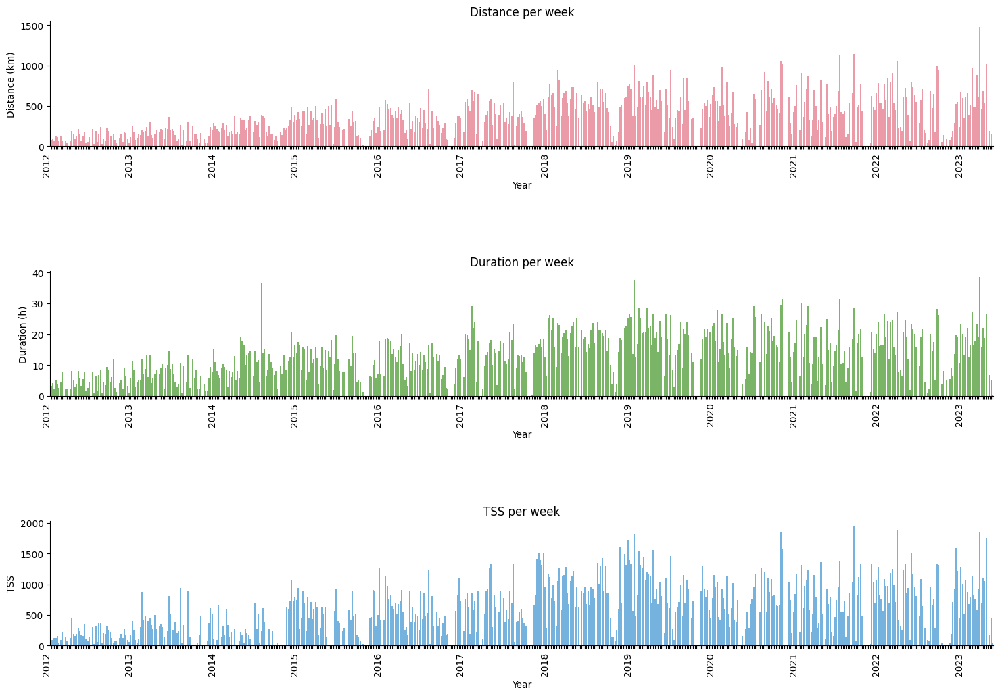

In [41]:
# Convert DatetimeIndex to year-week format
x_distance = df_distance_weekly.index.strftime('%Y - %U')
x_duration = df_duration_weekly.index.strftime('%Y - %U')

# Define a color palette for the plot
colors = sns.color_palette('husl', n_colors=3)

plt.figure(figsize=(18, 12))
grid = plt.GridSpec(3, 1, wspace=0, hspace=1)

# Plot the distance per week as vertical bars
ax1 = plt.subplot(grid[0,0])
sns.barplot(x=x_distance, y=df_distance_weekly["Distance (Km)"], width=0.8, alpha=0.8, color=colors[0])
plt.xlabel('Year')
plt.ylabel('Distance (km)')
plt.title("Distance per week")

# Generate year-only labels and set to xticks
labels = [item.get_text()[:4] if item.get_text()[:4] != x_distance[i - 1][:4] else '' for i, item in enumerate(ax1.get_xticklabels())]
ax1.set_xticklabels(labels, rotation=90, ha='right')

# Plot the duration
ax2 = plt.subplot(grid[1,0])
sns.barplot(x=x_duration, y=df_duration_weekly["Duration (hh:mm:ss)"], width=0.8, alpha=0.8, color=colors[1])
plt.xlabel('Year')
plt.ylabel('Duration (h)')
plt.title("Duration per week")

# Generate year-only labels and set to xticks
labels = [item.get_text()[:4] if item.get_text()[:4] != x_duration[i - 1][:4] else '' for i, item in enumerate(ax2.get_xticklabels())]
ax2.set_xticklabels(labels, rotation=90, ha='right')

# Plot the TSS
ax3 = plt.subplot(grid[2,0])
sns.barplot(x=x_duration, y=df_tss_weekly["TSS"], width=0.8, alpha=0.8, color=colors[2])
plt.xlabel('Year')
plt.ylabel('TSS')
plt.title("TSS per week")

# Generate year-only labels and set to xticks
labels = [item.get_text()[:4] if item.get_text()[:4] != x_duration[i - 1][:4] else '' for i, item in enumerate(ax3.get_xticklabels())]
ax3.set_xticklabels(labels, rotation=90, ha='right')

sns.despine()

plt.show()

In [37]:
x_distance

Index(['2012 - 02', '2012 - 03', '2012 - 04', '2012 - 05', '2012 - 06',
       '2012 - 07', '2012 - 08', '2012 - 09', '2012 - 10', '2012 - 11',
       ...
       '2023 - 10', '2023 - 11', '2023 - 12', '2023 - 13', '2023 - 14',
       '2023 - 15', '2023 - 16', '2023 - 17', '2023 - 18', '2023 - 19'],
      dtype='object', name='Date', length=592)

## 2.3. Mean maximal power (all and under fatigue)

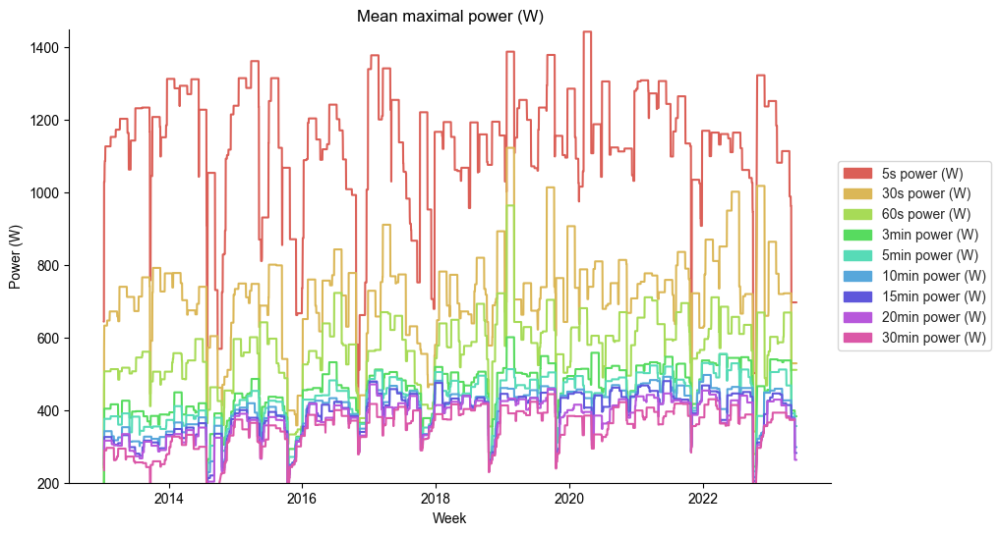

In [49]:
# create a subset with only the desired column
df_power = df.loc[:,["5s power (W)","30s power (W)","60s power (W)","3min power (W)","5min power (W)","10min power (W)","15min power (W)","20min power (W)","30min power (W)"]]

#Définition d'une couleur pour chaque pays
colors_power = sns.color_palette("hls", len(df_power.columns))
palette_power = {groupe: color for groupe, color in zip(df_power.columns, colors_power)}

handle=[]
for i in df_power.columns:
    label_patch = mpatches.Patch(color=palette_power[i], label=i)
    handle.append(label_patch)
    
# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# Set the style and color palette for the plot
sns.set_style("whitegrid")

# Plot each power column as a line on the same axis
for col in df_power.columns:
    sns.lineplot(x=df_power.index, y=col, data=df_power, ax=ax, color=palette_power[f"{col}"])

# Set the x- and y-axis labels
ax.set_xlabel('Year')
ax.set_ylabel('Power (W)')

# Add a legend for each line with a title
ax.legend(handles=handle, loc='center left', bbox_to_anchor=(1, 0.5))

# Set the y-axis limits
ax.set_ylim(200, 1450)

# Set the title of the plot
ax.set_title('Mean maximal power (W)')

sns.despine()

# Show the plot
plt.show()

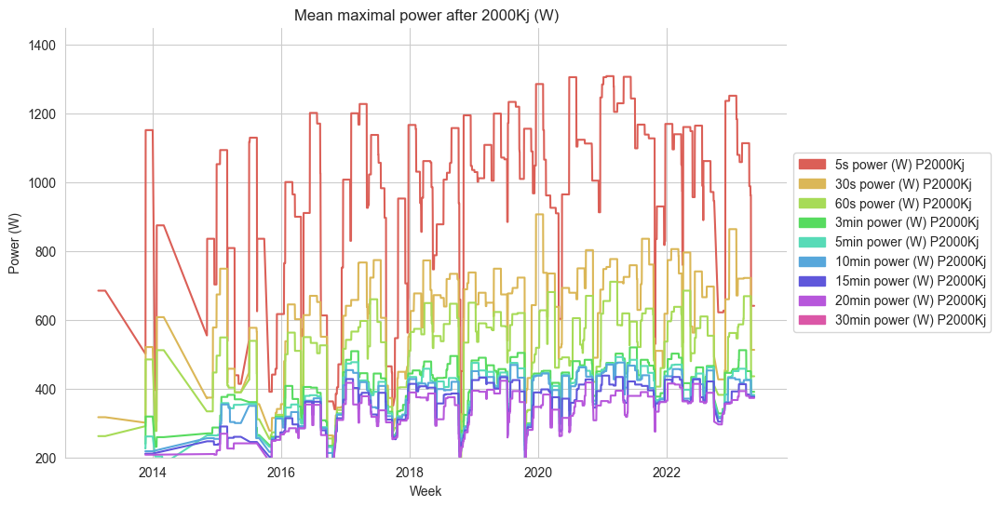

In [50]:
# create a subset with only the desired column
df_power_fatigue = df.loc[:,["5s power (W) P2000Kj","30s power (W) P2000Kj","60s power (W) P2000Kj","3min power (W) P2000Kj","5min power (W) P2000Kj","10min power (W) P2000Kj","15min power (W) P2000Kj","20min power (W) P2000Kj","30min power (W) P2000Kj"]]

#Définition d'une couleur pour chaque pays
colors_power_fatigue = sns.color_palette("hls", len(df_power_fatigue.columns))
palette_power_fatigue = {groupe: color for groupe, color in zip(df_power_fatigue.columns, colors_power_fatigue)}

handle=[]
for i in df_power_fatigue.columns:
    label_patch = mpatches.Patch(color=palette_power_fatigue[i], label=i)
    handle.append(label_patch)
    
# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# Set the style and color palette for the plot
sns.set_style("whitegrid")

# Plot each power column as a line on the same axis
for col in df_power_fatigue.columns:
    if pd.notnull(df_power_fatigue[col]).any() :
        sns.lineplot(x=df_power_fatigue.index, y=col, data=df_power_fatigue, ax=ax, color=palette_power_fatigue[col])

# Set the x- and y-axis labels
ax.set_xlabel('Year')
ax.set_ylabel('Power (W)')

# Add a legend for each line with a title
ax.legend(handles=handle, loc='center left', bbox_to_anchor=(1, 0.5))

# Set the y-axis limits
ax.set_ylim(200, 1450)

# Set the title of the plot
ax.set_title('Mean maximal power after 2000Kj (W)')

sns.despine()

# Show the plot
plt.show()

## 2.4. Year recap' (Distance, duration, nbr activity)

C:\Users\Violeau Pierre\AppData\Local\Temp\ipykernel_12572\3345468486.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test_bike["Date"] = pd.to_datetime(df_test_bike["Date"])


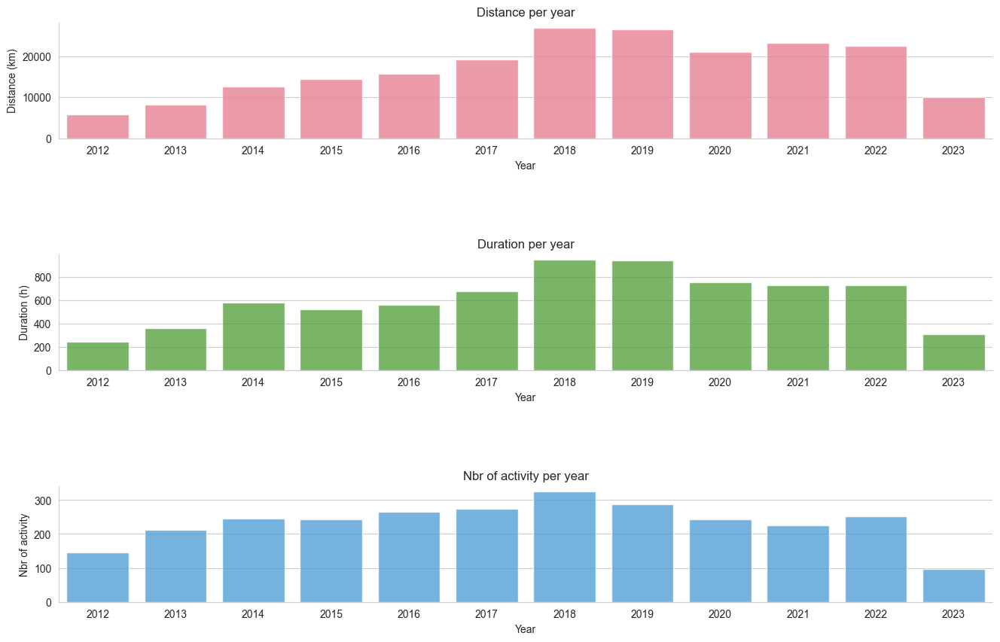

In [9]:
# Convert the "Duration" column to timedelta
df_test["Duration (hh:mm:ss)"] = pd.to_timedelta(df_test["Duration (hh:mm:ss)"])

df_test_bike = df_test.loc[df_test["Type"] == "Ride", :]

# Convert the "Date" column to datetime format
df_test_bike["Date"] = pd.to_datetime(df_test_bike["Date"])

# Group the data by week and calculate the sum of distance, duration, and TSS
df_duration_yearly = df_test_bike.loc[:,["Date","Duration (hh:mm:ss)"]].groupby(pd.Grouper(key='Date', freq='Y')).sum()
df_distance_yearly = df_test_bike.loc[:,["Date","Distance (Km)"]].groupby(pd.Grouper(key='Date', freq='Y')).sum()
df_activity_yearly = df_test_bike.loc[:,["Date","Type"]].groupby(pd.Grouper(key='Date', freq='Y')).count()


# Convert the "Duration" values to hours in the df_date_weekly DataFrame
df_duration_yearly["Duration (hh:mm:ss)"] = df_duration_yearly["Duration (hh:mm:ss)"].dt.total_seconds() / 3600

# Convert DatetimeIndex to year-week string format
x_distance_y = df_distance_yearly.index.strftime('%Y')
x_duration_y = df_duration_yearly.index.strftime('%Y')

# Define a color palette for the plot
colors = sns.color_palette('husl', n_colors=3)

plt.figure(figsize=(16,10))
grid = plt.GridSpec(3, 1, wspace=0, hspace=1)

# Plot the distance per week as vertical bars
plt.subplot(grid[0,0])
sns.barplot(x=x_distance_y, y=df_distance_yearly["Distance (Km)"], width=0.8, alpha=0.8, color=colors[0])
plt.xlabel('Year')
plt.ylabel('Distance (km)')
plt.title("Distance per year")

# Plot the duration
plt.subplot(grid[1,0])
sns.barplot(x=x_duration_y, y=df_duration_yearly["Duration (hh:mm:ss)"], width=0.8, alpha=0.8, color=colors[1])
plt.xlabel('Year')
plt.ylabel('Duration (h)')
plt.title("Duration per year")

# Plot the nbr of activity
plt.subplot(grid[2,0])
sns.barplot(x=x_duration_y, y=df_activity_yearly["Type"], width=0.8, alpha=0.8, color=colors[2])
plt.xlabel('Year')
plt.ylabel('Nbr of activity')
plt.title("Nbr of activity per year")

sns.despine()

plt.show()

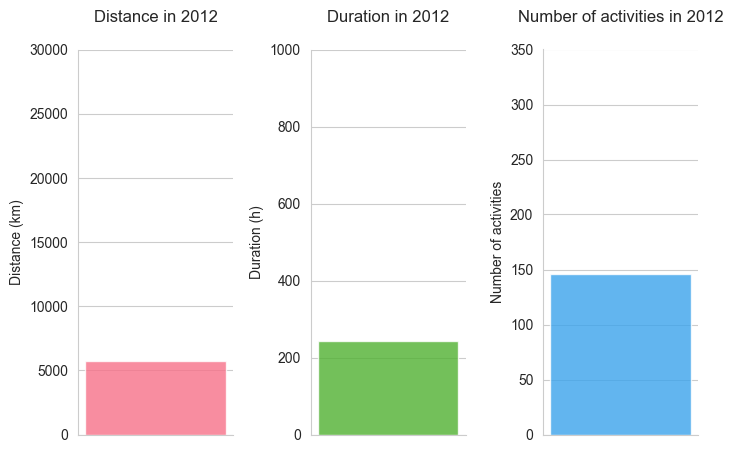

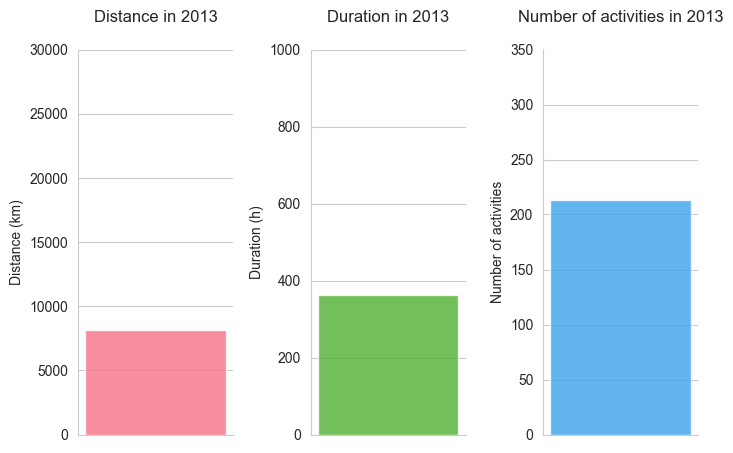

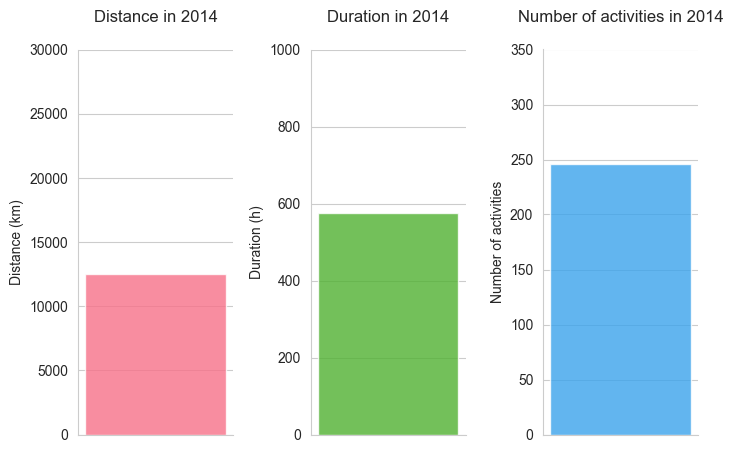

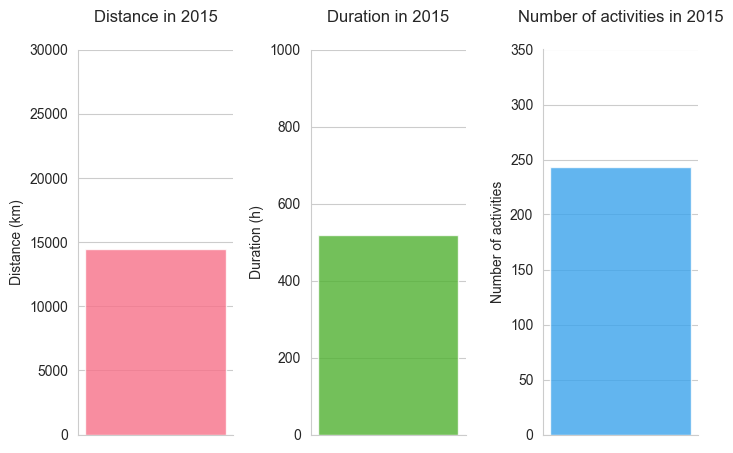

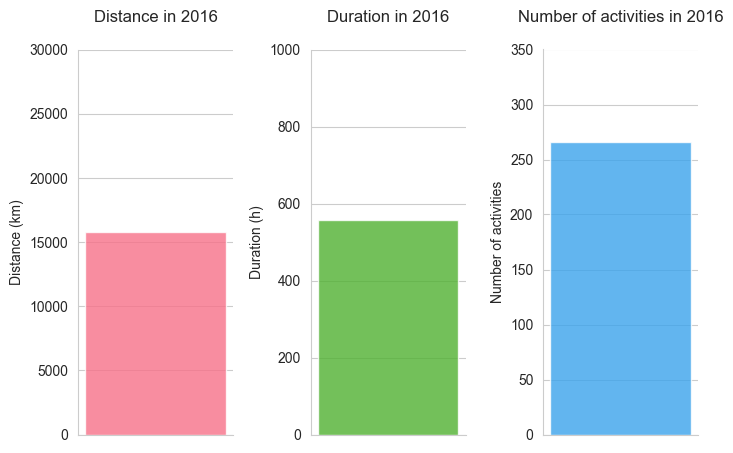

...

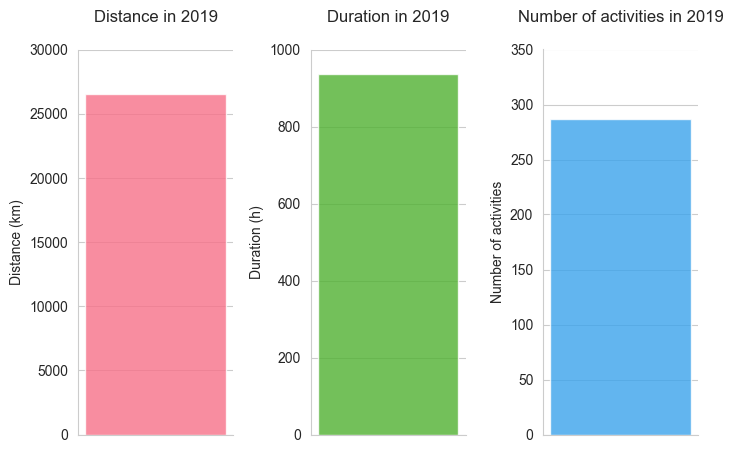

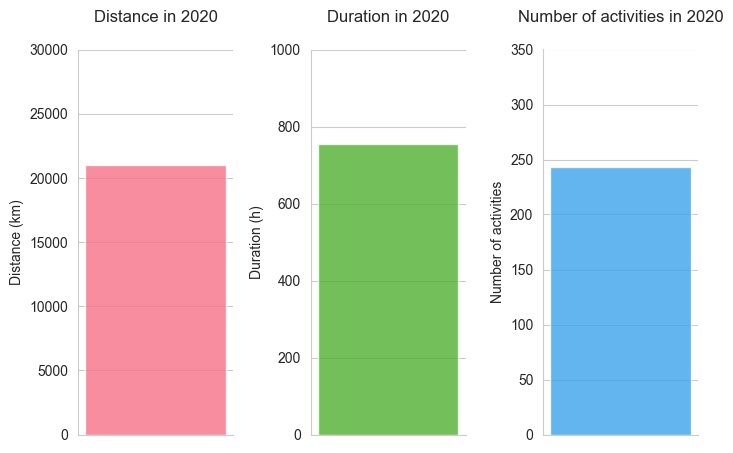

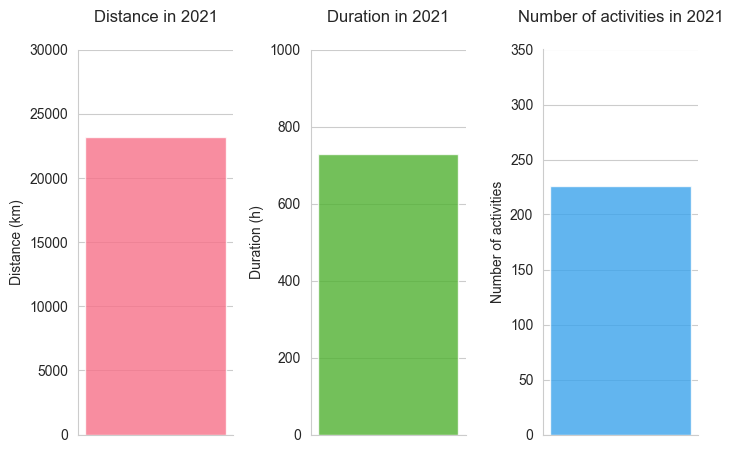

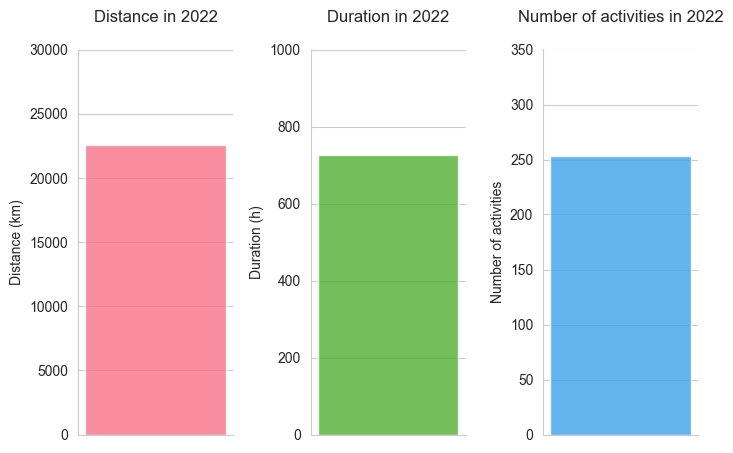

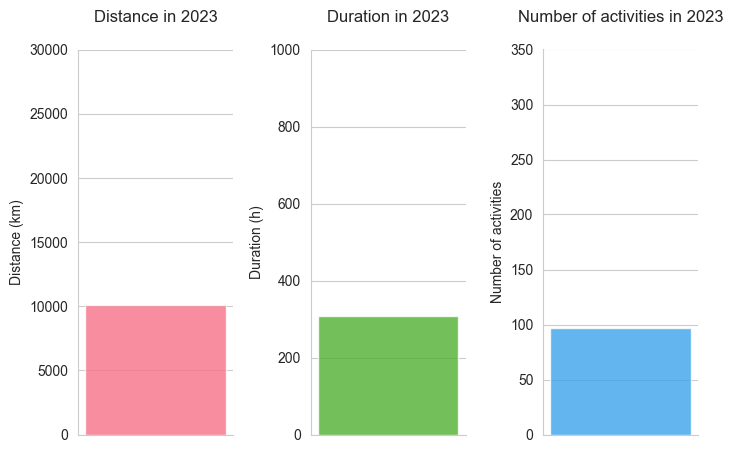

In [49]:
for row in df_duration_yearly.index:
    plt.figure(figsize=(8, 5))
    grid = plt.GridSpec(1, 3, wspace=0.5, hspace=1)
    # Plot the distance per year as vertical bars
    plt.subplot(grid[0, 0])
    plt.bar(x=[row], height=df_distance_yearly.loc[row, "Distance (Km)"], width=0.8, alpha=0.8, color=colors[0])
    plt.xticks([])  
    plt.ylim([0, 30000])
    #plt.xlabel(f'{row}')
    plt.ylabel('Distance (km)')
    plt.title(f"Distance in {row}", pad = 20)

    # Plot the duration
    plt.subplot(grid[0, 1])
    plt.bar(x=[row], height=df_duration_yearly.loc[row, "Duration (hh:mm:ss)"], width=0.8, alpha=0.8, color=colors[1])
    plt.xticks([]) 
    plt.ylim([0, 1000])
    #plt.xlabel(f'{row}')
    plt.ylabel('Duration (h)')
    plt.title(f"Duration in {row}", pad = 20)

    # Plot the number of activities
    plt.subplot(grid[0, 2])
    plt.bar(x=[row], height=df_activity_yearly.loc[row, "Type"], width=0.8, alpha=0.8, color=colors[2])
    plt.xticks([]) 
    plt.ylim([0, 350])
    #plt.xlabel(f'{row}')
    plt.ylabel('Number of activities')
    plt.title(f"Number of activities in {row}", pad = 20)

    sns.despine()

    plt.show()



## 2.5. TSS, ATL, CTL and TSB evolution

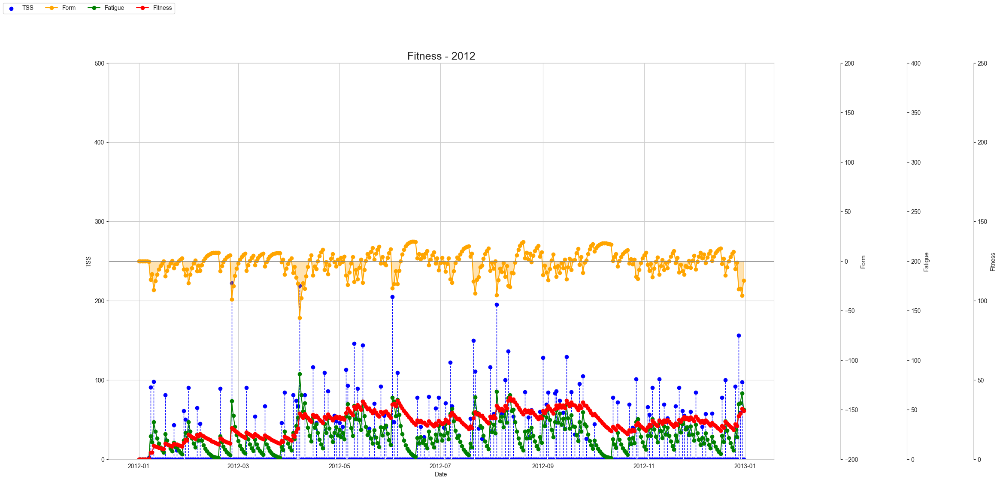

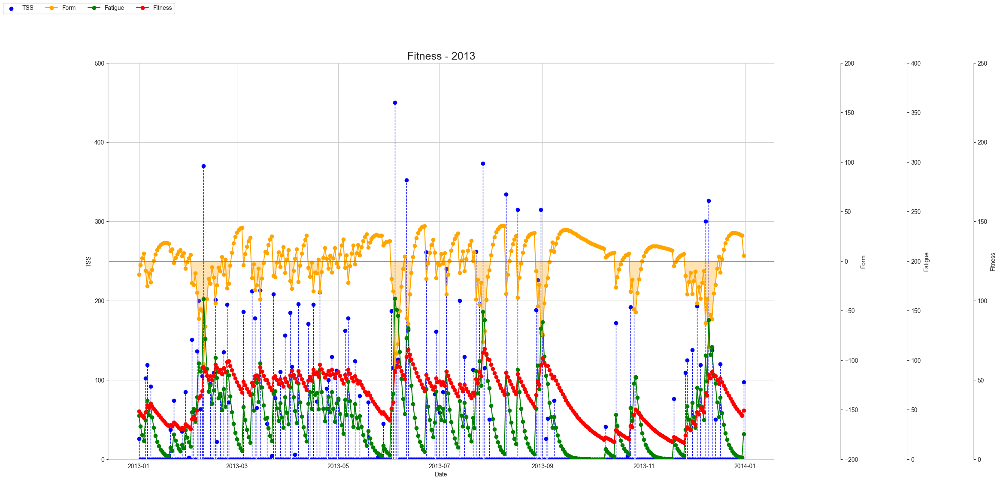

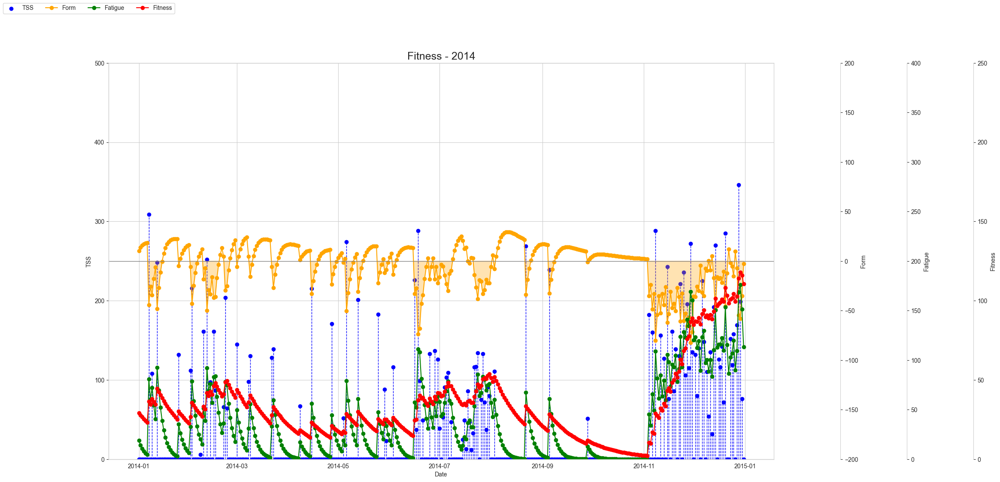

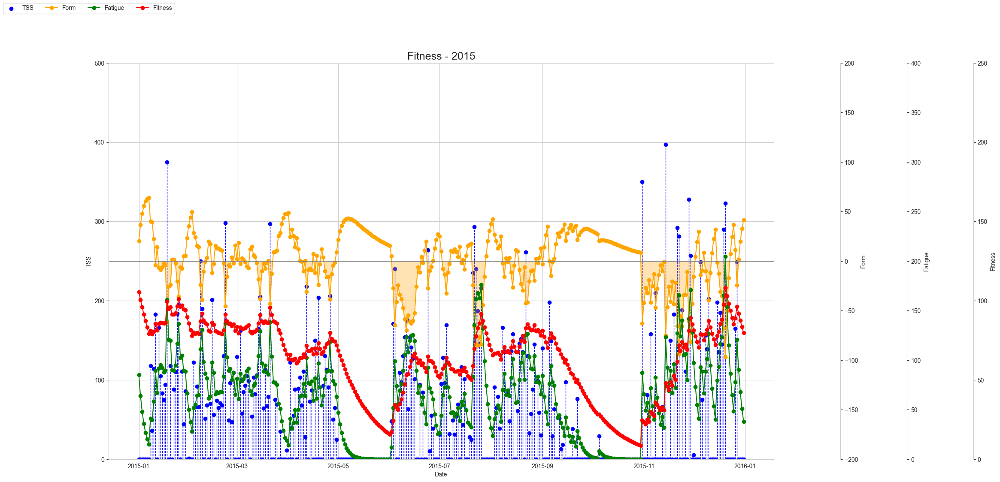

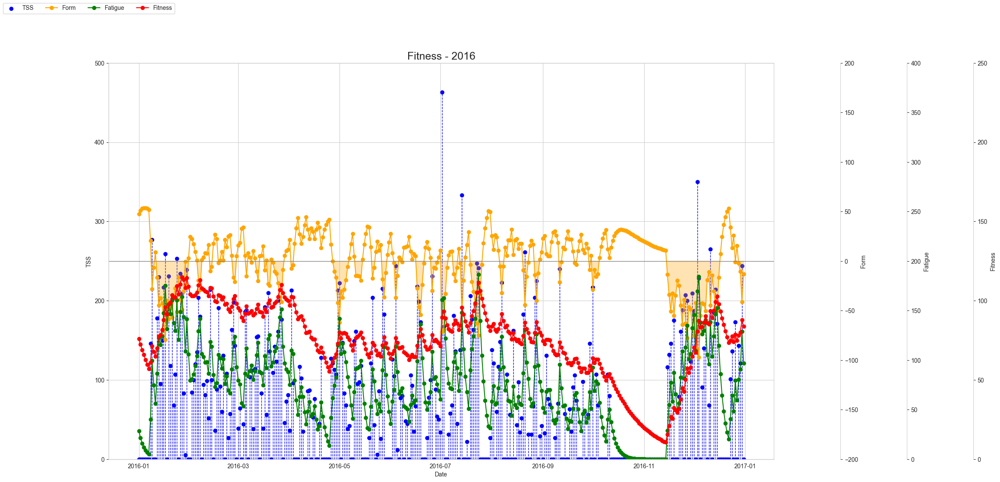

...

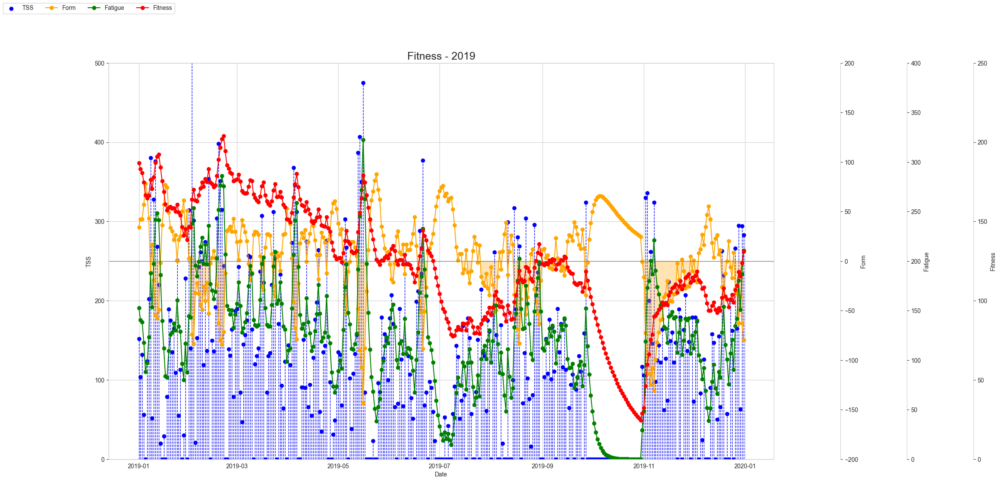

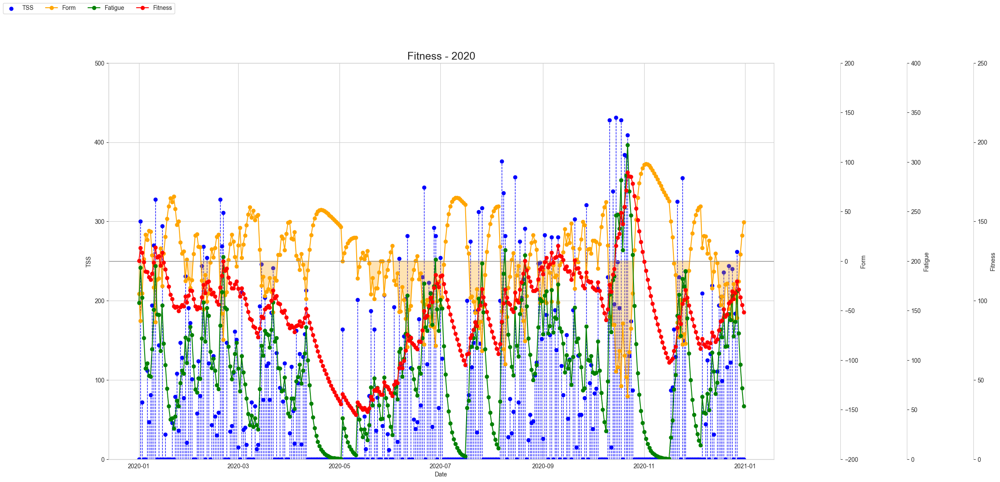

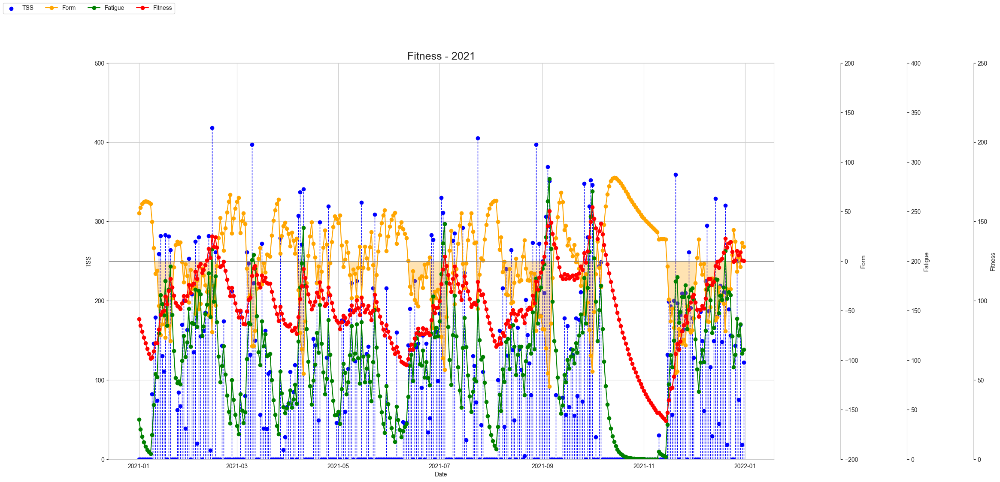

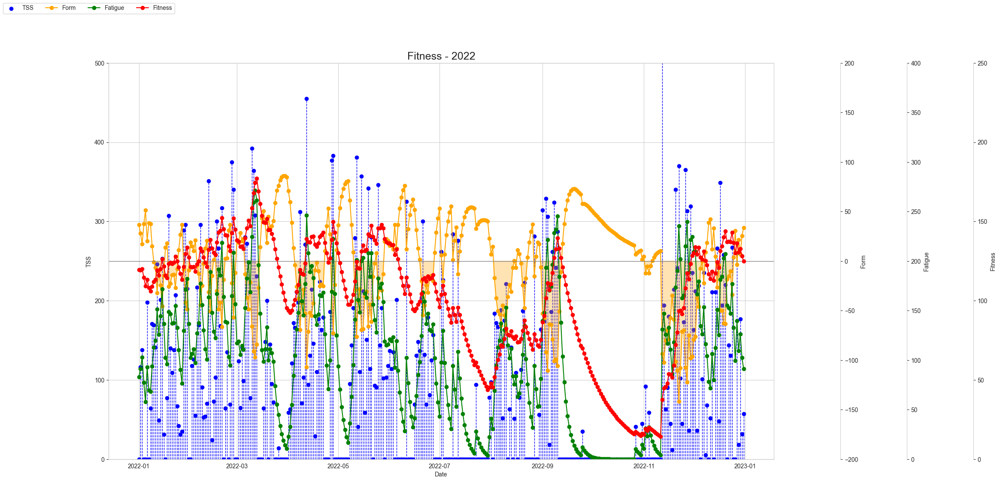

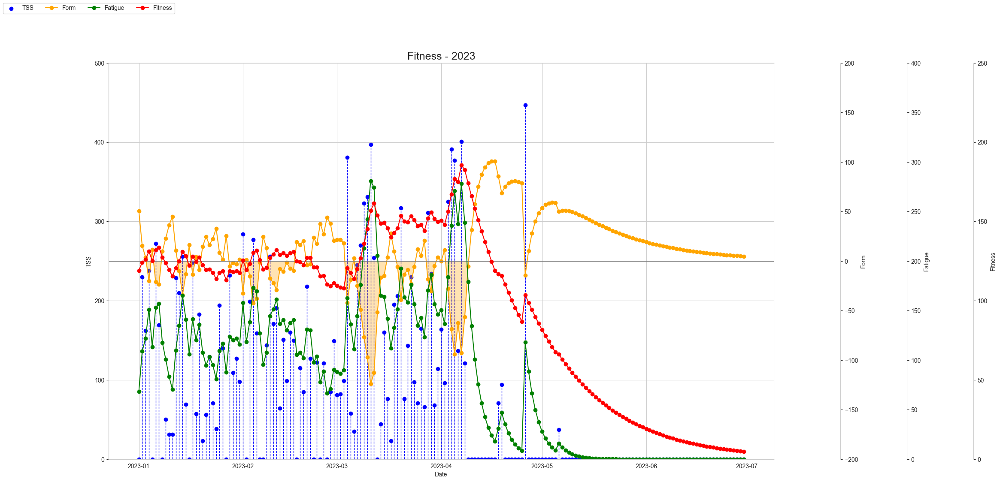

In [55]:
# List of years from 2012 to 2023
years = range(2012, 2024)

for year in years:
    df_year = df[str(year)]

    fig, ax = plt.subplots(figsize=(20, 12))
    ax_tsb = ax.twinx()
    ax_atl = ax.twinx()
    ax_ctl = ax.twinx()

    ax.scatter(x=df_year.index, y=df_year["TSS"], color='blue', marker='o', label='TSS')
    ax.set_ylim(top=500, bottom=0)

    for date, tss in zip(df_year.index, df_year["TSS"]):
        ax.vlines(date, 0, tss, color='blue', linewidth=1, linestyle='--')

    ax_atl.plot(df_year.index, df_year["ATL"], color='green', linestyle='-', marker='o', label='Fatigue')
    ax_atl.set_ylim(top=400, bottom=0)
    ax_ctl.plot(df_year.index, df_year["CTL"], color='red', linestyle='-', marker='o', label='Fitness')
    ax_ctl.set_ylim(top=250, bottom=0)

    ax_tsb.plot(df_year.index, df_year["TSB"], color='orange', linestyle='-', marker='o', label='Form')
    ax_tsb.fill_between(df_year.index, 0, df_year["TSB"], where=df_year["TSB"]<0, interpolate=True, color='orange', alpha = 0.3)
    ax_tsb.axhline(y=0, color='gray', linewidth=1)
    ax_tsb.set_ylim(top=200, bottom=-200)

    ax.set_xlabel("Date")
    ax.set_ylabel("TSS")
    ax_atl.set_ylabel("Fatigue")
    ax_ctl.set_ylabel("Fitness")
    ax_tsb.set_ylabel("Form")

    handles, labels = [], []
    for ax in [ax, ax_tsb, ax_atl, ax_ctl]:
        for h, l in zip(*ax.get_legend_handles_labels()):
            handles.append(h)
            labels.append(l)

    fig.legend(handles, labels, loc='upper left', ncol=4)

    ax_tsb.spines['right'].set_position(('axes', 1.1))
    ax_atl.spines['right'].set_position(('axes', 1.2))
    ax_ctl.spines['right'].set_position(('axes', 1.3))

    ax.grid(False)
    ax_atl.grid(False)
    ax_ctl.grid(False)

    ax_tsb.grid(False)

    ax.set_title(f'Fitness - {year}', fontsize = 18)

    plt.show()


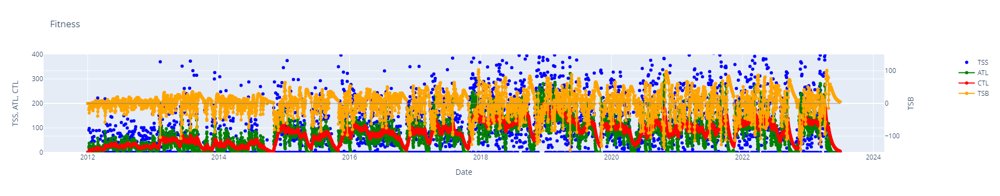

In [56]:
# Create a subplot with secondary y-axes
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add TSS, ATL, CTL, and TSB traces to the figure
fig.add_trace(go.Scatter(x=df.index, y=df["TSS"], mode='markers', name='TSS', marker=dict(color='blue')), secondary_y=False)
fig.add_trace(go.Scatter(x=df.index, y=df["ATL"], mode='lines+markers', name='ATL', line=dict(color='green')), secondary_y=False)
fig.add_trace(go.Scatter(x=df.index, y=df["CTL"], mode='lines+markers', name='CTL', line=dict(color='red')), secondary_y=False)
fig.add_trace(go.Scatter(x=df.index, y=df["TSB"], mode='lines+markers', name='TSB', line=dict(color='orange')), secondary_y=True)

# Set the y-axes range
fig.update_yaxes(range=[0, 400], secondary_y=False)
fig.update_yaxes(range=[-150, 150], secondary_y=True)

# Add a horizontal line at y=0 for TSB
fig.add_shape(type='line', x0=df.index.min(), x1=df.index.max(), y0=0, y1=0, yref='y2', xref='x', line=dict(color='gray', width=1))

# Set the x- and y-axis labels
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='TSS, ATL, CTL', secondary_y=False)
fig.update_yaxes(title_text='TSB', secondary_y=True)

# Set the title of the plot
fig.update_layout(title_text='Fitness')

# Show the plot
fig.show()


## 2.6. Power distribution 

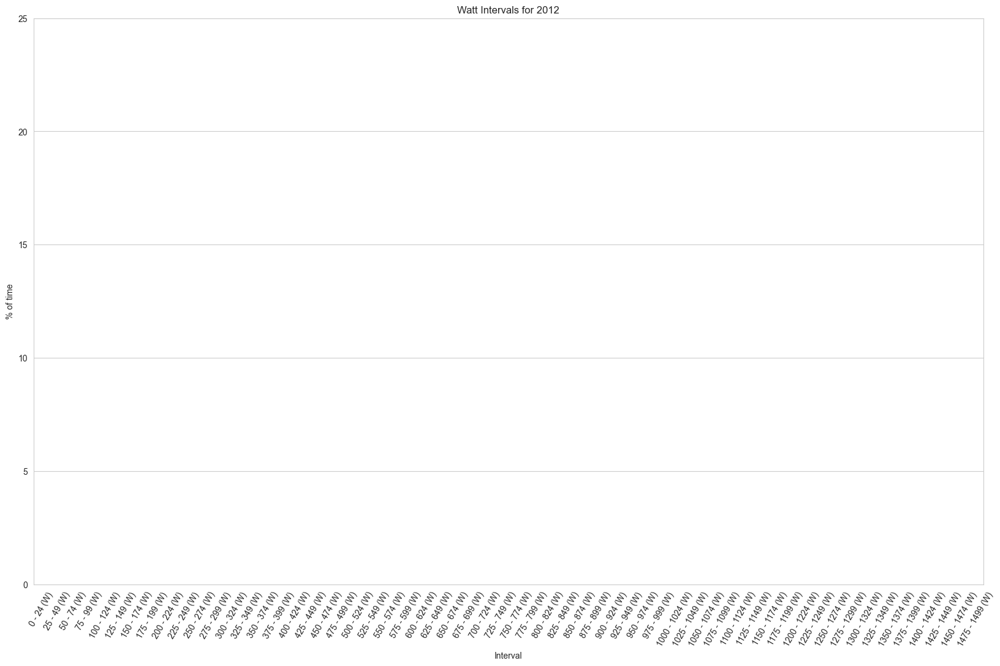

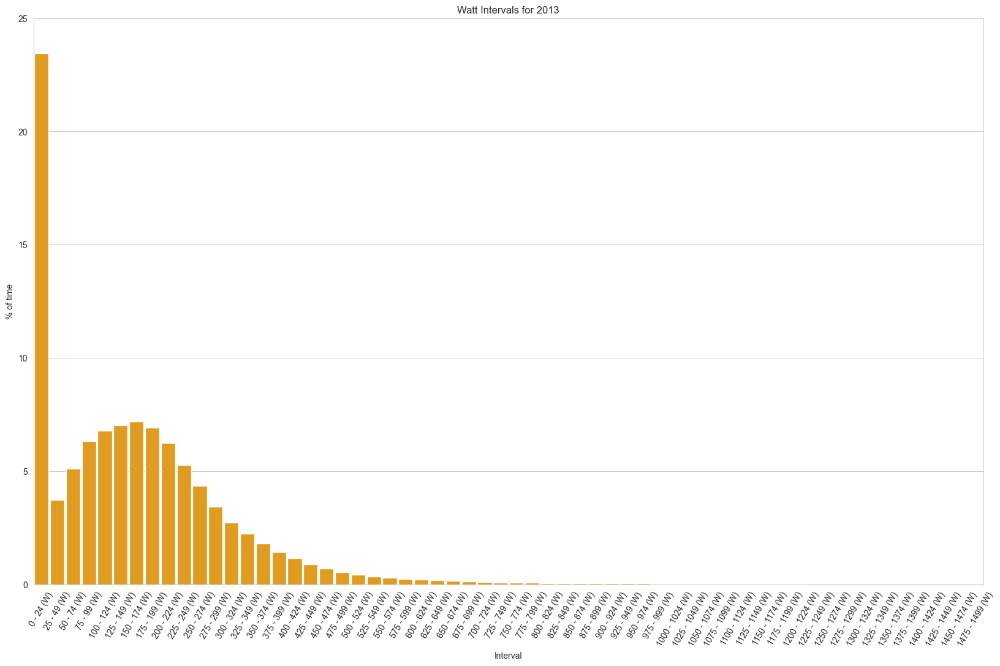

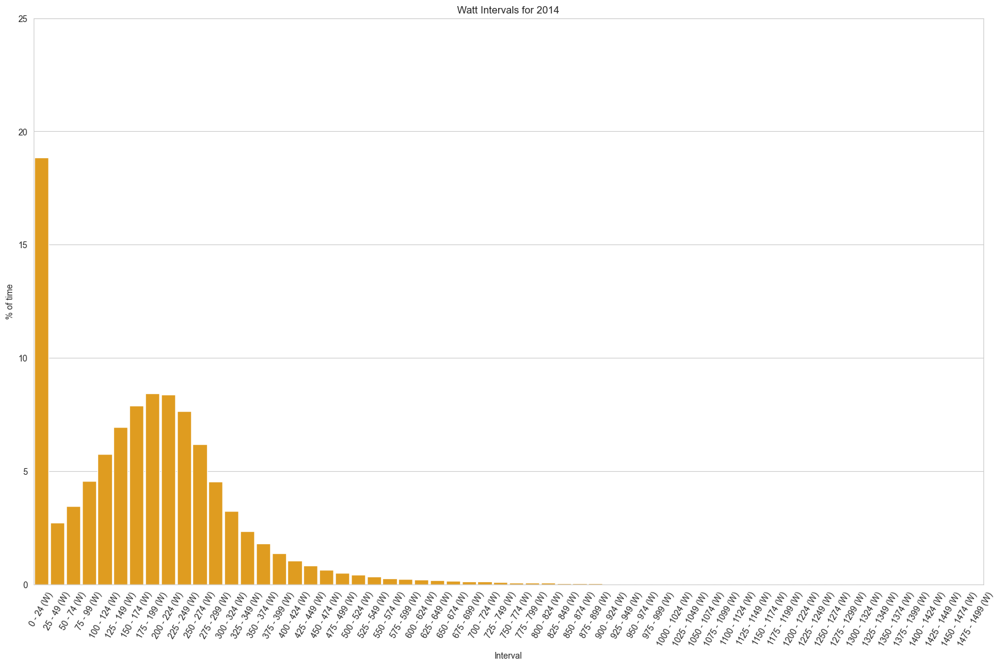

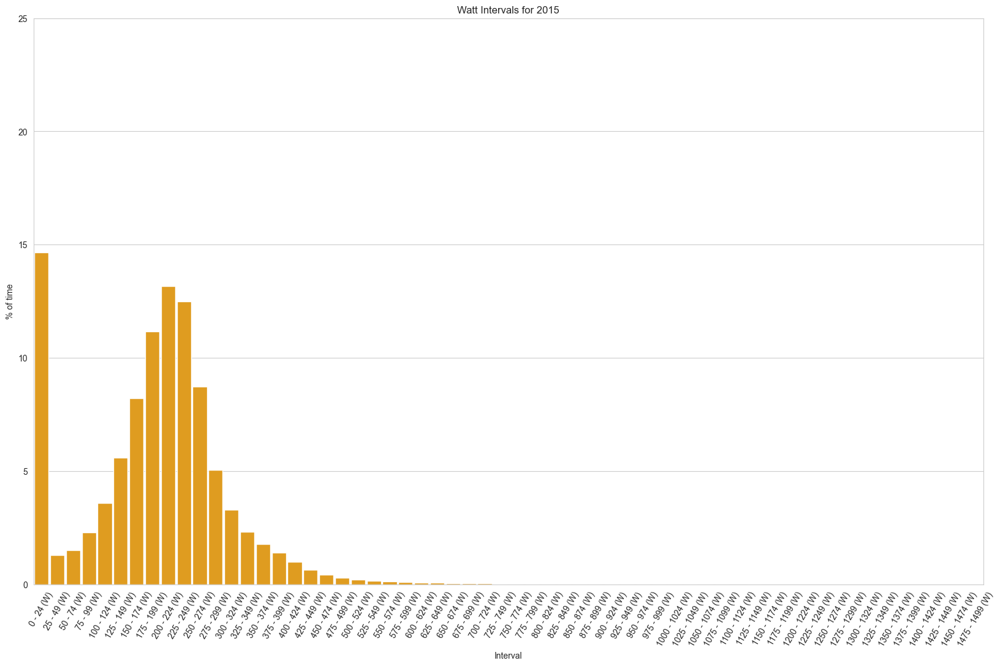

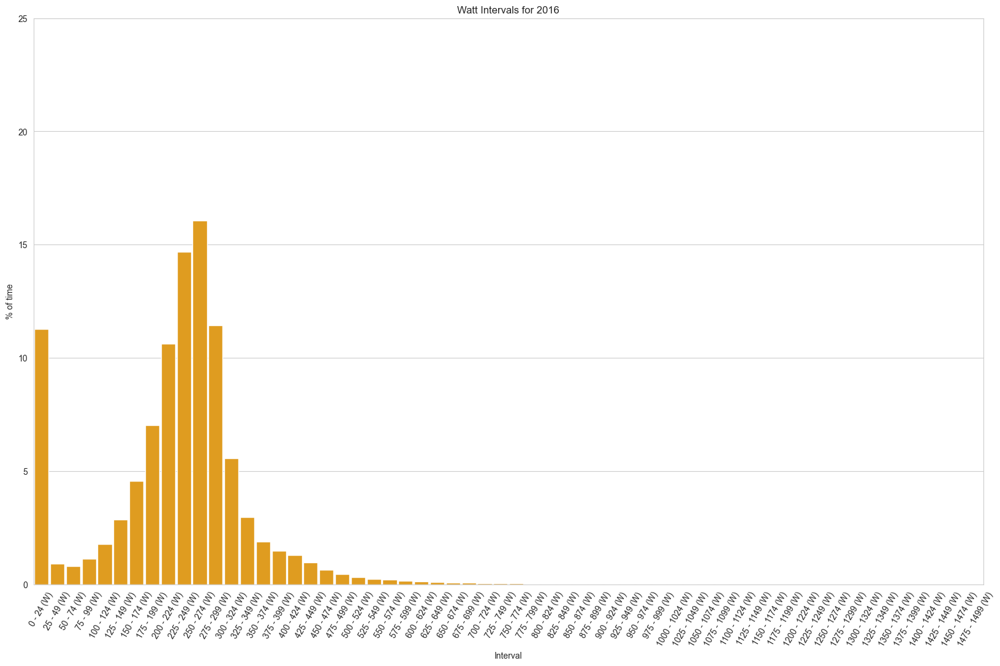

...

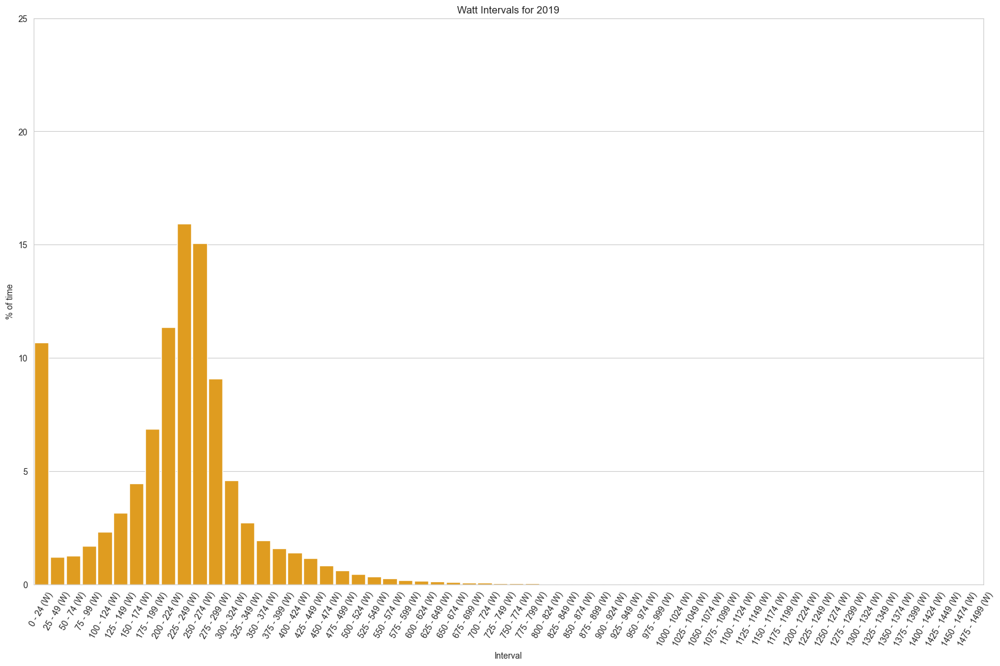

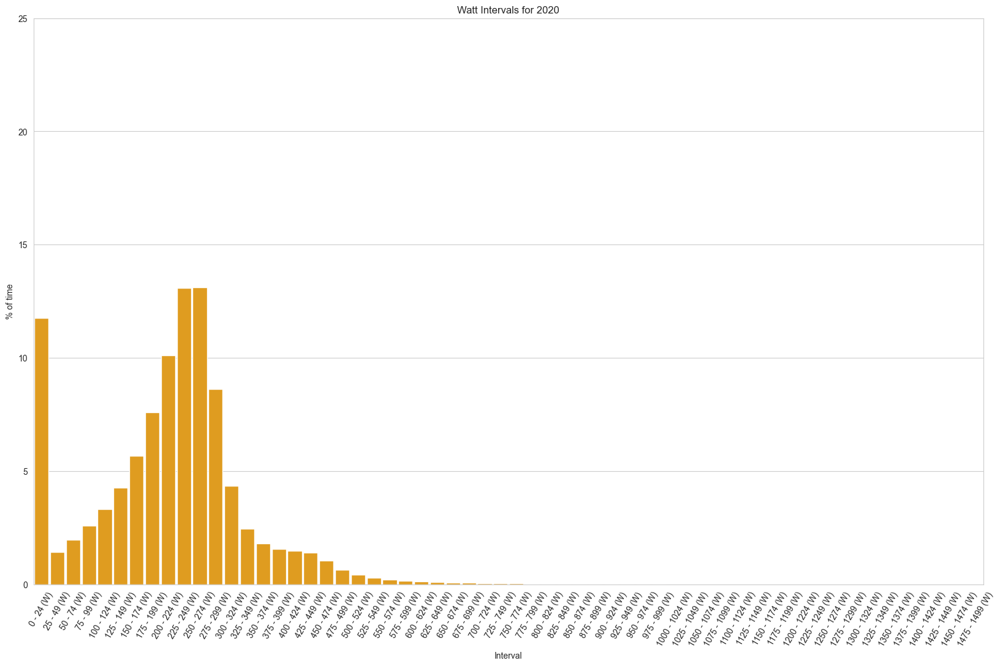

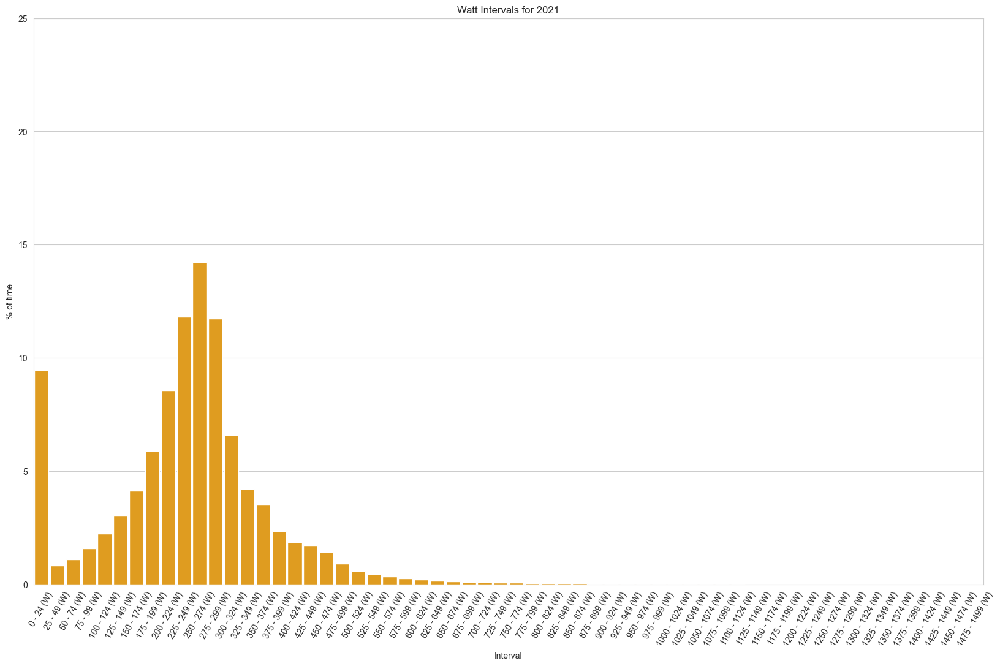

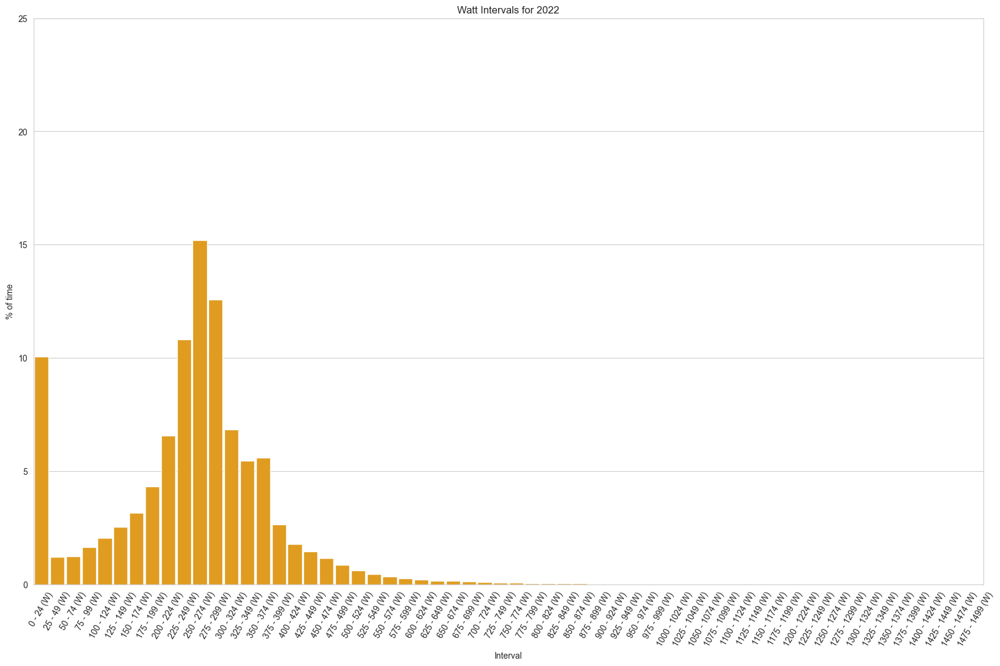

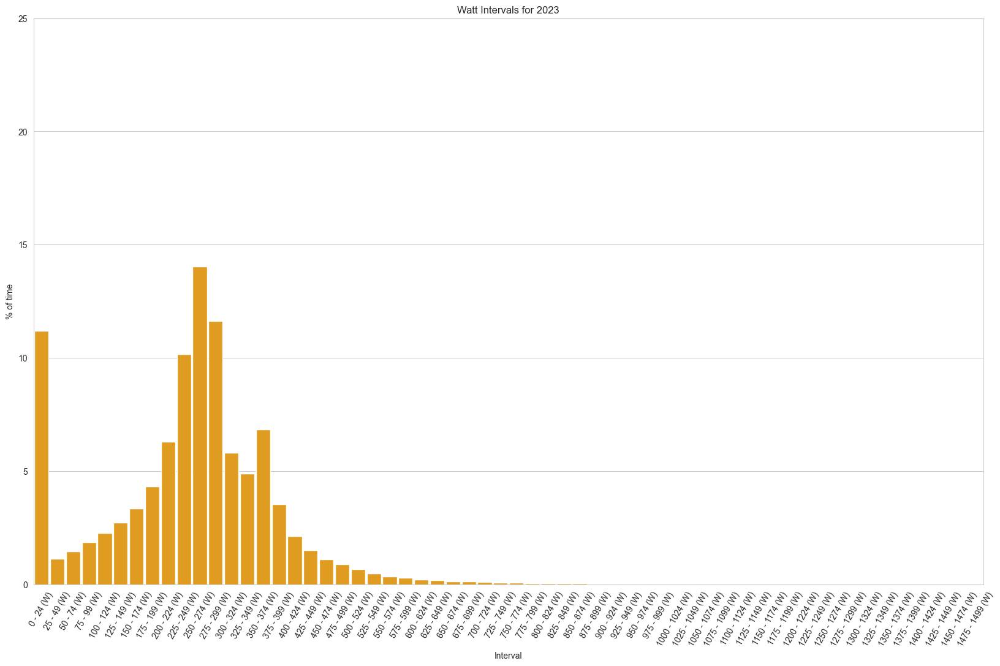

In [51]:
for year in df_zone_power_yearly.index:
    fig, ax = plt.subplots(figsize=(20, 12))
    sns.barplot(x=df_zone_power_yearly.columns, y=df_zone_power_yearly.loc[year],width = 0.9, color='orange')
    plt.title(f'Watt Intervals for {year}')
    plt.xlabel('Interval')
    plt.xticks(rotation=60)
    plt.ylabel('% of time')
    ax.set_ylim(top=25, bottom=0)
    plt.show()

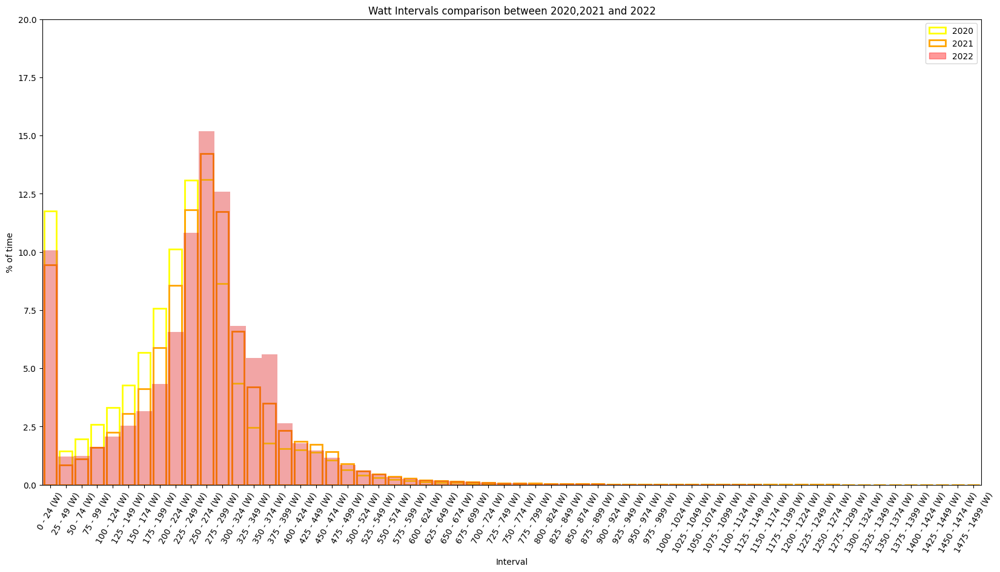

In [20]:
fig, ax = plt.subplots(figsize=(20, 10))
bar = sns.barplot(x=df_zone_power_yearly.columns, y=df_zone_power_yearly.loc[2020], edgecolor='yellow',linewidth=2)
for rect in bar.patches:
    rect.set_facecolor('none')
bar = sns.barplot(x=df_zone_power_yearly.columns, y=df_zone_power_yearly.loc[2021], edgecolor='orange',linewidth=2)
for rect in bar.patches:
    rect.set_facecolor('none')
sns.barplot(x=df_zone_power_yearly.columns, y=df_zone_power_yearly.loc[2022],width = 1, alpha = 0.4,color='red')
plt.title('Watt Intervals comparison between 2020,2021 and 2022')
legend_labels = ['2020', '2021', '2022']
handles = [plt.Rectangle((0,0),1,1,edgecolor='yellow',facecolor = 'white', linewidth=2),plt.Rectangle((0,0),1,1,edgecolor='orange',facecolor = 'white', linewidth=2),plt.Rectangle((0,0),1,1, color='red', alpha=0.4)]
plt.legend(handles, legend_labels)
plt.xlabel('Interval')
plt.xticks(rotation=60)
plt.ylabel('% of time')
ax.set_ylim(top=20, bottom=0)
plt.show()

## 2.7. PPR and PPR 2000KJ

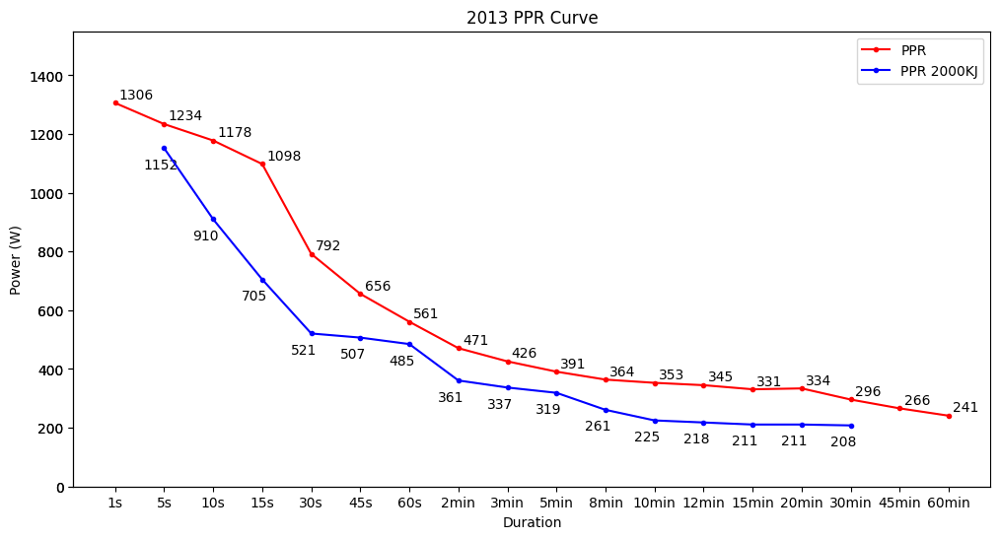

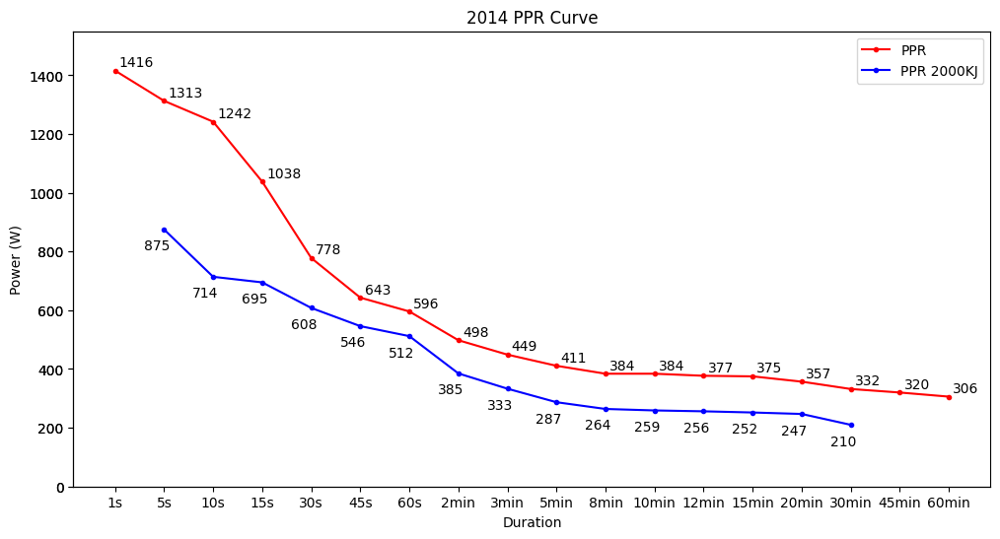

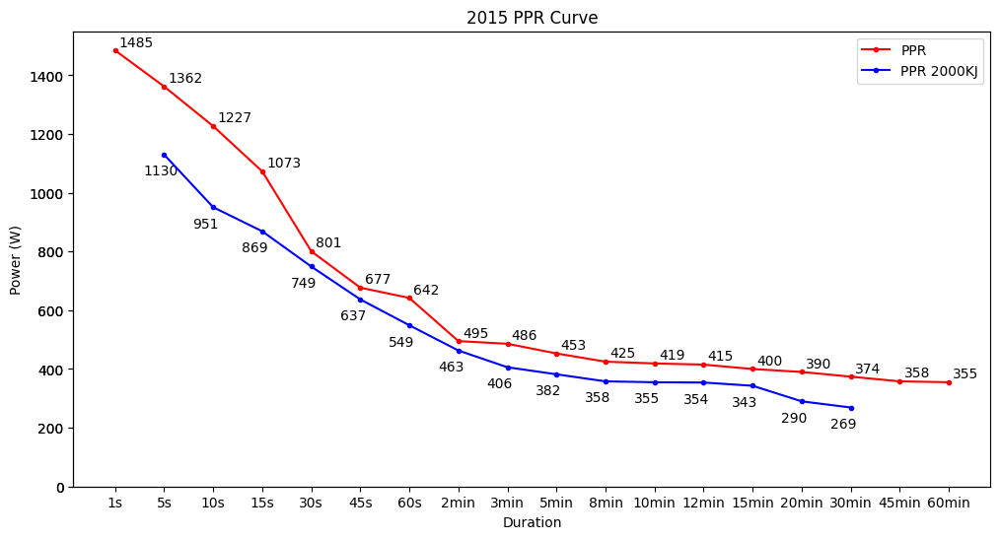

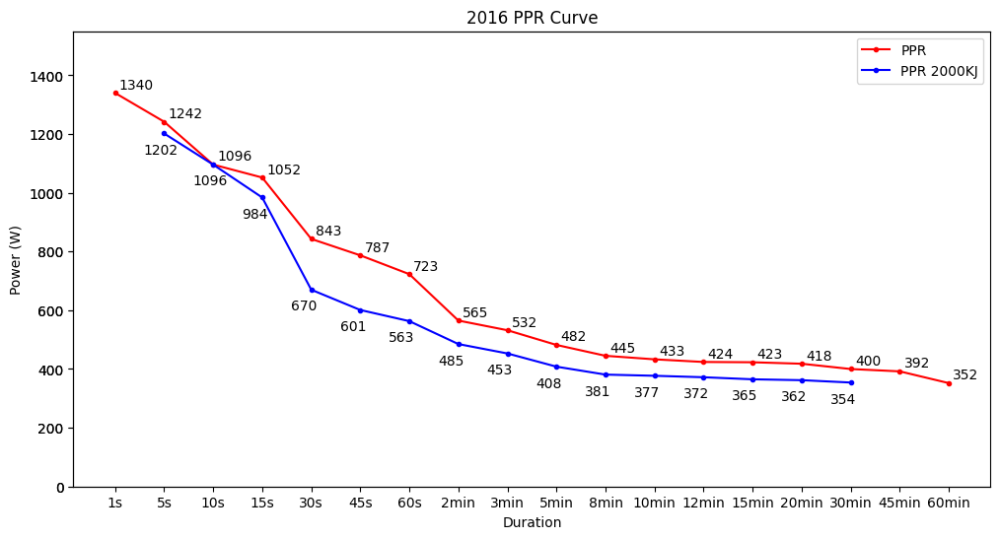

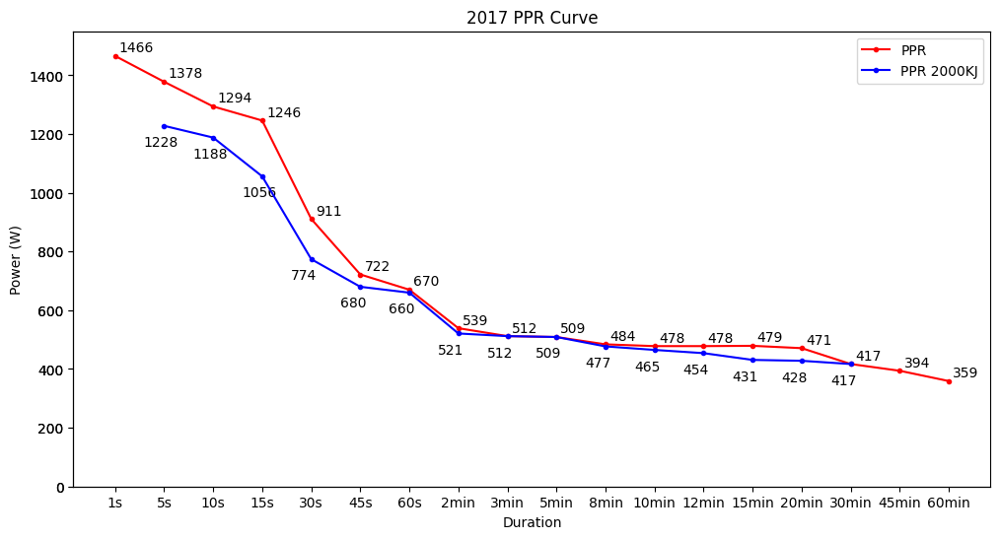

...

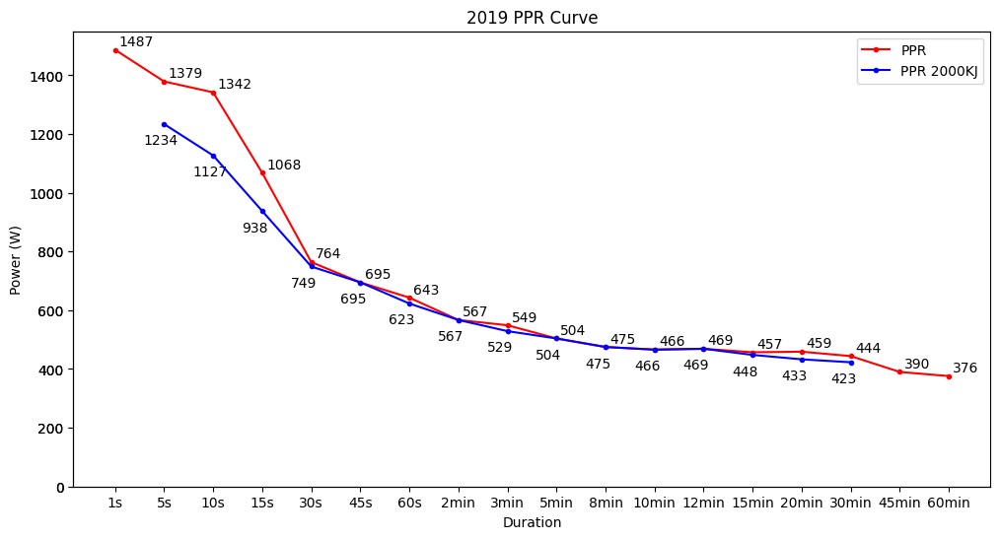

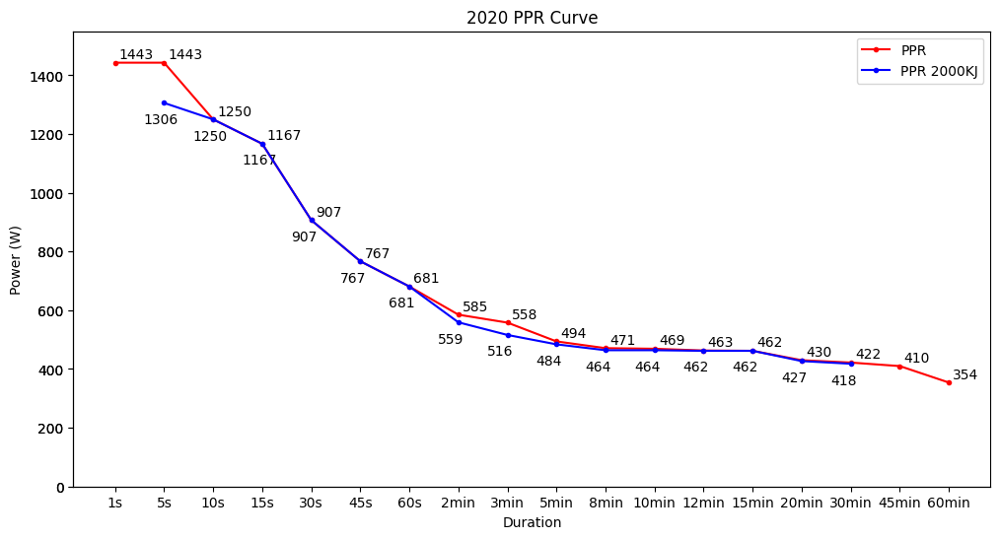

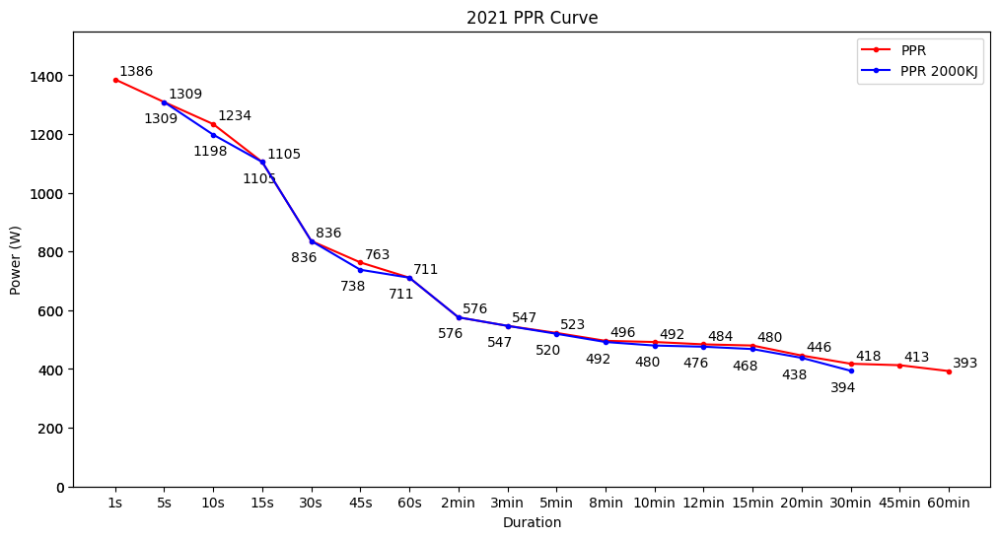

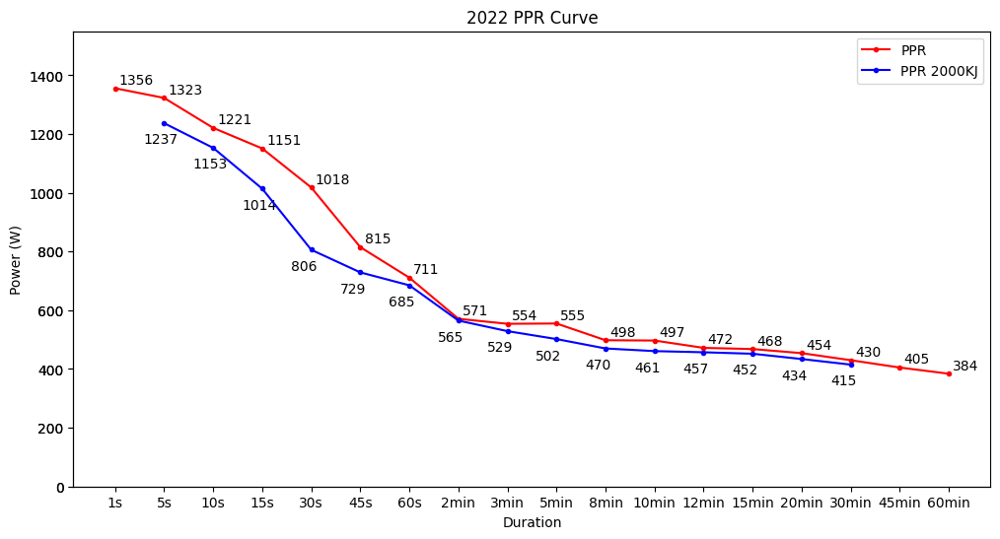

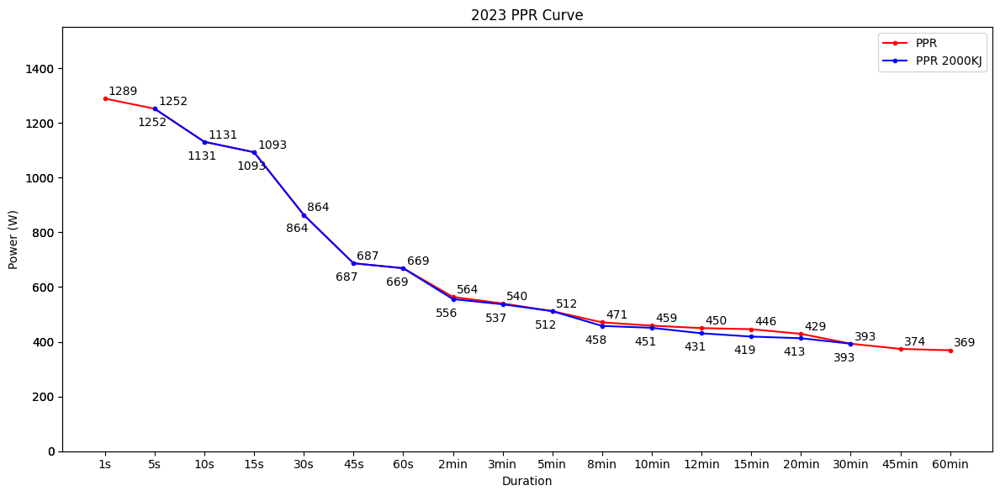

In [37]:
# Plotting one graph per year
for column in df_PPR_yearly.columns:
    df_PPR_yearly.rename(columns={column: column.replace(' power (W)', '')}, inplace=True)
    
for column in df_PPR_2000_yearly.columns:
    df_PPR_2000_yearly.rename(columns={column: column.replace(' power (W) P2000Kj', '')}, inplace=True)

for row in df_PPR_yearly.index:
    fig, ax = plt.subplots(figsize=(12, 6))
    ax_2000 = ax.twinx()
    
    PPR_plot = df_PPR_yearly.loc[row, :]
    PPR_2000_plot = df_PPR_2000_yearly.loc[row, :]
    
    # Plot PPR
    line1 = ax.plot(df_PPR_yearly.columns, PPR_plot, color='red', marker=".", label="PPR")
    ax.set_ylim(top=1550, bottom=0)
    
    # Add value for each marker
    for i, value in enumerate(PPR_plot):
        ax.annotate(value, xy=(df_PPR_yearly.columns[i], value),
                    xytext=(3, 3), textcoords='offset points')

    # Plot PPR 2000KJ
    line2 = ax_2000.plot(df_PPR_2000_yearly.columns, PPR_2000_plot, color='blue', marker=".", label="PPR 2000KJ")
    ax_2000.set_ylim(top=1550, bottom=0)
    
    for i, value in enumerate(PPR_2000_plot):
        ax.annotate(value, xy=(df_PPR_2000_yearly.columns[i], value),
                    xytext=(-15, -15), textcoords='offset points')
    
    ax.set_xlabel("Duration")
    ax.set_ylabel("Power (W)")
    ax.set_title(f'{row} PPR Curve')
    
    # Combine legend handles and labels
    lines = line1 + line2
    labels = [line.get_label() for line in lines]

    # Add legend
    ax.legend(lines, labels, loc="upper right")

    ax_2000.spines['right'].set_visible(False)
    ax_2000.yaxis.set_ticks_position('left')

plt.tight_layout()
plt.show()


In [142]:
df_PPR_yearly.columns

Index(['1s', '5s', '10s', '15s', '30s', '45s', '60s', '2min', '3min', '5min',
       '8min', '10min', '12min', '15min', '20min', '30min', '45min', '60min'],
      dtype='object')

In [169]:
df_PPR_2000_yearly.columns

Index(['5s', '10s', '15s', '30s', '60s', '2min', '3min', '5min', '8min',
       '10min', '12min', '15min', '20min', '30min'],
      dtype='object')

## 2.8. Radar chart of power compare to top 10% value of professional rider

In [53]:
df_test_bike = df_test.loc[df_test["Type"] == "Ride", :]

df_power_spider_year = df_test_bike.loc[:,["Date","5s power (W)","60s power (W)","5min power (W)","10min power (W)","30min power (W)","60min power (W)","120min power (W)"]]

df_power_spider_year['Date'] = pd.to_datetime(df_power_spider_year['Date'])

# droping activity that result of a powermeter default
date_to_drop = [pd.Timestamp('2019-02-12'),pd.Timestamp('2019-09-19'),pd.Timestamp('2019-09-24')] # the date we want to drop

# find the index of the rows with the date to drop
index_to_drop = [(df_power_spider_year[df_power_spider_year['Date'] == date].index) for date in date_to_drop]
# drop these rows
for index in index_to_drop :
    df_power_spider_year = df_power_spider_year.drop(index)

    
df_power_spider_year['Date'] = pd.to_datetime(df_power_spider_year['Date'])
df_power_spider_year['Date'] = df_power_spider_year['Date'].dt.year
df_power_spider_year = df_power_spider_year.groupby(["Date"]).max()

df_power_spider_year = df_power_spider_year.drop(2012)

for column in df_power_spider_year.columns:
        df_power_spider_year.rename(columns={column: column.replace(' power (W)', '')}, inplace=True)

#Convert W to W/kg
df_power_spider_year = df_power_spider_year/69

list_W_per_KG_pro = [20.83, 11.33, 7.65, 7.00, 6.24, 5.76, 5.12]

for column, power_value in zip(df_power_spider_year.columns, list_W_per_KG_pro):
    for row in df_power_spider_year.index:
        df_power_spider_year.at[row, column] = df_power_spider_year.at[row, column] / power_value * 100 \
        if (df_power_spider_year.at[row, column] / power_value * 100) <= 100 else 100

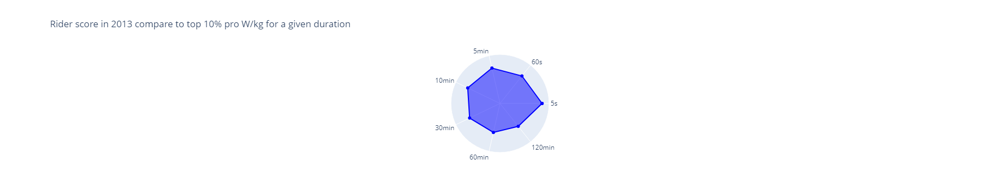

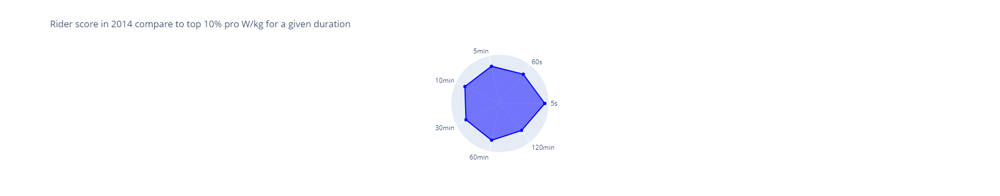

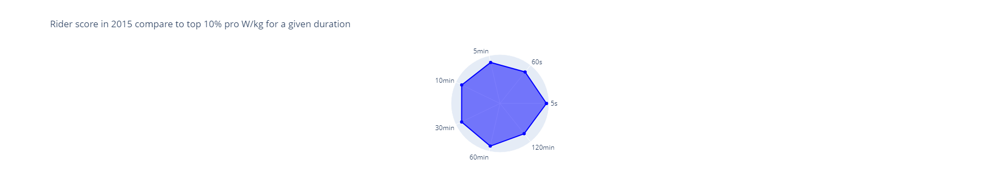

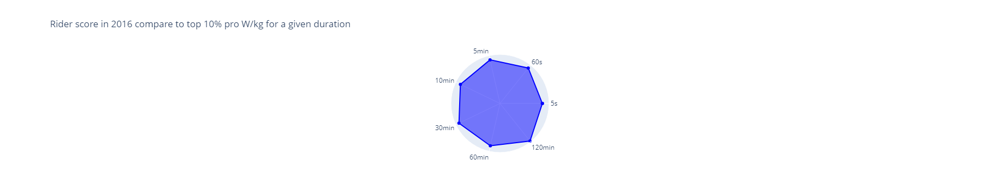

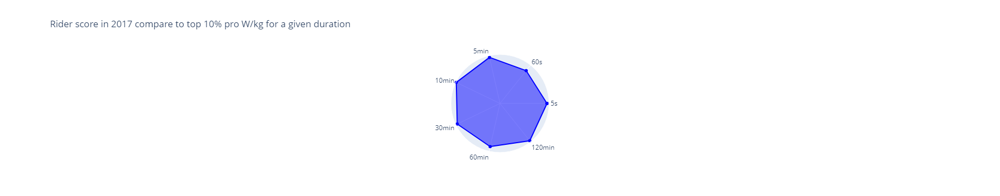

...

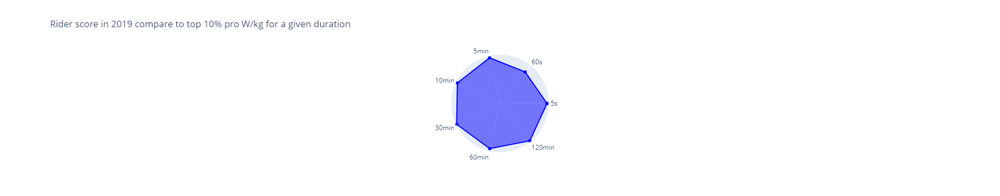

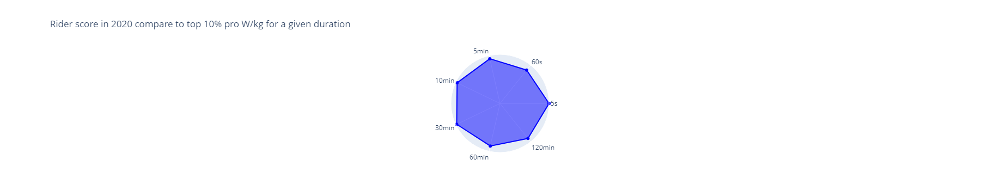

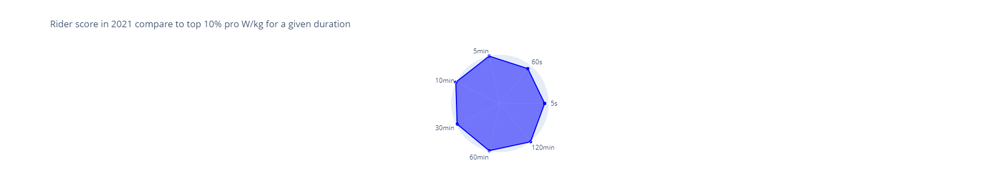

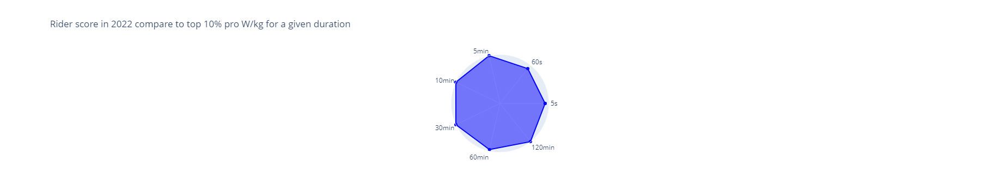

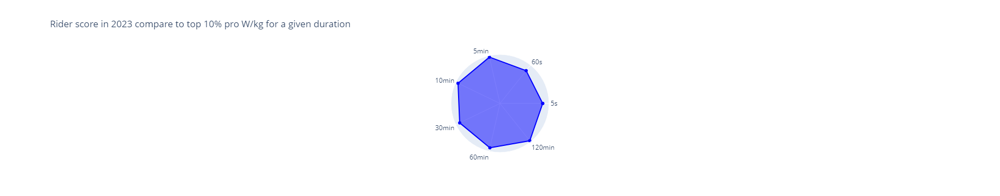

In [54]:
for row in df_power_spider_year.index:
   
    df_power_spider = df_power_spider_year.loc[row, :]
    
    r_values = df_power_spider.values.tolist() + [df_power_spider.values[0]]
    theta_values = df_power_spider_year.columns.tolist() + [df_power_spider_year.columns[0]]
    
    fig = go.Figure(data=go.Scatterpolar(r=r_values,theta= theta_values,fill='toself', line=dict(color="blue")))

    fig.update_layout(polar=dict(radialaxis=dict(visible=False, range=[0, 100]),),showlegend=False, title = go.layout.Title(text=f"Rider score in {row} compare to top 10% pro W/kg for a given duration"))

    fig.show()
